In [2]:
import os
import pandas as pd
import matplotlib.pyplot as plt
from gtda.pipeline import Pipeline
from gtda.time_series import Resampler
from gtda.diagrams import PersistenceEntropy, Scaler, HeatKernel, BettiCurve
import numpy as np
from gtda.time_series import SingleTakensEmbedding, takens_embedding_optimal_parameters, TakensEmbedding
from sklearn.decomposition import PCA
from gtda.plotting import plot_point_cloud
from gtda.homology import VietorisRipsPersistence
from gtda.metaestimators import CollectionTransformer

We start by analyzing the public data set and looking at the normal operations time series, to set a benchmark for the analysis of well events (abnormal operations). 

In [3]:
sample_data_df = pd.read_csv("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/0/WELL-00005_20170402180043.csv")

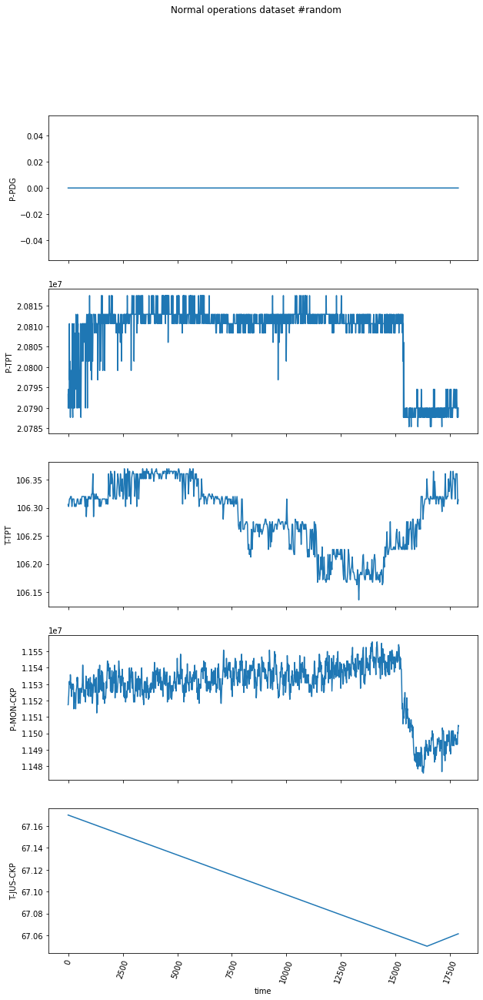

In [4]:
fig, ts = plt.subplots(5,figsize=(10,20),sharex = True)

fig.suptitle('Normal operations dataset #random')
ts[4].set_xlabel('time')
ts[0].set_ylabel("P-PDG")
ts[1].set_ylabel('P-TPT')
ts[2].set_ylabel('T-TPT')
ts[3].set_ylabel("P-MON-CKP")
ts[4].set_ylabel('T-JUS-CKP')

degrees = 70
plt.xticks(rotation=degrees)

ts[0].plot(sample_data_df.index, sample_data_df["P-PDG"])
ts[1].plot(sample_data_df.index, sample_data_df["P-TPT"])
ts[2].plot(sample_data_df.index, sample_data_df["T-TPT"])
ts[3].plot(sample_data_df.index, sample_data_df["P-MON-CKP"])
ts[4].plot(sample_data_df.index, sample_data_df["T-JUS-CKP"])

## Analysis of Normal Operations: P- TPT

In [5]:
def find_shortest_file(path, label):
    tmp = []
    os.chdir(path)
    for file in os.listdir():
        data_df = pd.read_csv(file)
        tmp.append(len(data_df[label]))
    return min(tmp)

In [6]:
def read_files(path, label, limit):
    data = []
    os.chdir(path)
    i = 0
    for file in os.listdir():
        data_df = pd.read_csv(file)
        # fill NaN with an interpolated value
        data_df = data_df.interpolate()
        period = int(len(data_df)/limit)
        periodicSampler = Resampler(period=period)
        print(i,file)
        # resample the files to that all of them are the same length (in entries)
        # NOTE: timestamps are omitted and timesteps are going to be different for each resampled time series!
        index_sampled, signal_sampled = periodicSampler.fit_transform_resample(data_df.index, data_df[label])
        data.append(signal_sampled)
        i += 1
    data_T = list(map(list, zip(*data)))
    df = pd.DataFrame.from_records(data_T)
    return data, df

In [21]:
find_shortest_file("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/0/", "P-TPT")

7010

In [22]:
normal_signals, normal_df = read_files("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/0/", "P-TPT",2000)

0 WELL-00002_20170625220127.csv
1 WELL-00008_20170611080445.csv
2 WELL-00002_20170810020026.csv
3 WELL-00007_20170801180000.csv
4 WELL-00002_20170612110022.csv
5 WELL-00001_20170527160000.csv
6 WELL-00001_20170527060000.csv
7 WELL-00005_20170812170000.csv
8 WELL-00008_20170703060123.csv
9 WELL-00006_20170828140031.csv
10 WELL-00006_20170209000114.csv
11 WELL-00008_20170612140047.csv
12 WELL-00005_20170814200000.csv
13 WELL-00002_20170623150127.csv
14 WELL-00002_20170620140116.csv
15 WELL-00002_20170613070011.csv
16 WELL-00002_20170621180032.csv
17 WELL-00005_20170815050000.csv
18 WELL-00002_20170621030054.csv
19 WELL-00006_20170207080124.csv
20 WELL-00002_20170218210134.csv
21 WELL-00002_20170214220322.csv
22 WELL-00006_20170508090031.csv
23 WELL-00002_20170621080422.csv
24 WELL-00002_20170625170232.csv
25 WELL-00008_20170612190111.csv
26 WELL-00001_20170219070031.csv
27 WELL-00002_20170210230203.csv
28 WELL-00008_20170702050135.csv
29 WELL-00002_20170804210000.csv
30 WELL-00005_201708

245 WELL-00002_20170619080054.csv
246 WELL-00006_20170824100000.csv
247 WELL-00002_20170614080057.csv
248 WELL-00002_20170612210000.csv
249 WELL-00002_20170619030032.csv
250 WELL-00002_20170213060225.csv
251 WELL-00006_20170815160000.csv
252 WELL-00006_20170815060000.csv
253 WELL-00002_20170618070105.csv
254 WELL-00006_20170817080000.csv
255 WELL-00006_20170817180000.csv
256 WELL-00002_20170617220127.csv
257 WELL-00006_20170819050000.csv
258 WELL-00006_20170819150000.csv
259 WELL-00006_20170209100207.csv
260 WELL-00001_20170425040207.csv
261 WELL-00001_20170201020207.csv
262 WELL-00002_20131211230015.csv
263 WELL-00006_20170224020000.csv
264 WELL-00006_20170826220114.csv
265 WELL-00001_20170823150000.csv
266 WELL-00001_20170823050000.csv
267 WELL-00001_20170523120000.csv
268 WELL-00001_20170218060218.csv
269 WELL-00005_20170813200000.csv
270 WELL-00002_20170625070243.csv
271 WELL-00003_20170514010000.csv
272 WELL-00005_20170815170000.csv
273 WELL-00003_20170514110000.csv
274 WELL-00006

490 WELL-00002_20170210080407.csv
491 WELL-00002_20170406050000.csv
492 WELL-00002_20170406150000.csv
493 WELL-00001_20170201170311.csv
494 WELL-00002_20170217200225.csv
495 WELL-00003_20170820230053.csv
496 WELL-00008_20170817100246.csv
497 WELL-00002_20170808100000.csv
498 WELL-00006_20170506120042.csv
499 WELL-00002_20170808000000.csv
500 WELL-00002_20170307200031.csv
501 WELL-00001_20170523220000.csv
502 WELL-00005_20170816230000.csv
503 WELL-00002_20170219120152.csv
504 WELL-00002_20170618120600.csv
505 WELL-00008_20170611230123.csv
506 WELL-00005_20170830210000.csv
507 WELL-00002_20170809160026.csv
508 WELL-00006_20170509150042.csv
509 WELL-00006_20170222050000.csv
510 WELL-00006_20170222150000.csv
511 WELL-00002_20170621130116.csv
512 WELL-00001_20170825120000.csv
513 WELL-00001_20170825020000.csv
514 WELL-00006_20170827080114.csv
515 WELL-00006_20170821120000.csv
516 WELL-00001_20170528220000.csv
517 WELL-00006_20170821020000.csv
518 WELL-00002_20170310030146.csv
519 WELL-00008

In [23]:
normal_df

,0,1,2,3,4,5,6,7,8,9,...,587,588,589,590,591,592,593,594,595,596
0,8698015.0,13987430.0,8648771.0,13036680.0,8055306.0,14184150.0,14221150.0,20932460.0,13385940.0,21146550.0,...,8706865.0,8550073.0,13849550.0,20997960.0,20811280.0,10005130.0,20934760.0,8179326.0,8499783.0,8101855.0
1,8698015.0,13987350.0,8648351.0,13036650.0,8053976.0,14184150.0,14222040.0,20928630.0,13386310.0,21146550.0,...,8706575.0,8550913.0,13849890.0,20998830.0,20810660.0,10005970.0,20924420.0,8179326.0,8500314.0,8099195.0
2,8698015.0,13987280.0,8647931.0,13036630.0,8052646.0,14184150.0,14222930.0,20930930.0,13386690.0,21146550.0,...,8706285.0,8551753.0,13850120.0,20996810.0,20811070.0,10006810.0,20925570.0,8179326.0,8500847.0,8096535.0
3,8698015.0,13987210.0,8647511.0,13036610.0,8051316.0,14184150.0,14223820.0,20930170.0,13386260.0,21146550.0,...,8705994.0,8552593.0,13849610.0,20995280.0,20812750.0,10007650.0,20933610.0,8179326.0,8501379.0,8093875.0
4,8698015.0,13987130.0,8647091.0,13036590.0,8049986.0,14184150.0,14224050.0,20927870.0,13385710.0,21146550.0,...,8705704.0,8553433.0,13849100.0,20997580.0,20811490.0,10008490.0,20916380.0,8179326.0,8501910.0,8091215.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2034,8517541.0,13986990.0,8526448.0,13027260.0,8654125.0,14204100.0,14230150.0,20914080.0,13384670.0,21146550.0,...,8411819.0,8539048.0,13848690.0,20996620.0,20817550.0,10005030.0,20881900.0,7741931.0,8578317.0,8817712.0
2035,8518283.0,13986880.0,8527725.0,13026200.0,8656786.0,14204100.0,14231470.0,20912930.0,13385310.0,21146550.0,...,8411388.0,8538307.0,13845720.0,20996340.0,20819220.0,10004710.0,20868110.0,7740601.0,8578317.0,8817712.0
2036,8517471.0,13986770.0,8529002.0,13025140.0,8657501.0,14204100.0,14232790.0,20911210.0,13385110.0,21146550.0,...,8410956.0,8537864.0,13841630.0,20996050.0,20818800.0,10004390.0,20870410.0,7745090.0,8578317.0,8817712.0
2037,8516141.0,13986650.0,8530279.0,13024080.0,8656274.0,14204100.0,14234100.0,20910490.0,13384920.0,21146550.0,...,8410525.0,8537421.0,13837550.0,20995760.0,20817550.0,10004070.0,20872710.0,7750410.0,8578317.0,8817712.0


Some of these time series are not stationary. I remove those with a drift higher than 5 Bar.

In [25]:
naughty_list = []
for timeserie in normal_df:
    if abs(normal_df[timeserie].iloc[-1]-normal_df[timeserie].iloc[0]) > 500000:
        print(timeserie, normal_df[timeserie].iloc[-1], normal_df[timeserie].iloc[0])
        naughty_list.append(timeserie)

4 8655046.0 8055306.0
27 8102092.0 7560889.0
41 8618216.0 7644843.0
54 8815877.0 8079578.0
70 8691697.0 8159376.0
143 8712088.0 8058631.0
305 8573496.0 9268692.0
312 8645015.0 7850483.0
322 8638166.0 8063186.0
333 7611760.0 8119477.0
375 8892261.0 8145411.0
431 9057107.0 8178993.0
441 9057107.0 7947331.0
446 9273143.0 7461141.0
455 8837662.0 8037888.0
478 8578603.0 8059628.0
482 8842649.0 8317958.0
551 8199275.0 7580839.0
596 8817712.0 8101855.0


In [26]:
sample_data_df = pd.read_csv("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/0/WELL-00002_20170620090254.csv")

In [27]:
sample_data_df

,timestamp,P-PDG,P-TPT,T-TPT,P-MON-CKP,T-JUS-CKP,P-JUS-CKGL,T-JUS-CKGL,QGL,class
0,2017-06-20 09:02:54.000000,0.0,7644843.0,116.0646,1510376.0,71.31687,2321735.0,NaN,0.0,0
1,2017-06-20 09:02:55.000000,0.0,7644760.0,116.0659,1496053.0,71.30801,2321736.0,NaN,0.0,0
2,2017-06-20 09:02:56.000000,0.0,7644677.0,116.0672,1481731.0,71.29915,2321736.0,NaN,0.0,0
3,2017-06-20 09:02:57.000000,0.0,7644594.0,116.0685,1467408.0,71.29029,2321736.0,NaN,0.0,0
4,2017-06-20 09:02:58.000000,0.0,7644511.0,116.0698,1453086.0,71.28143,2321736.0,NaN,0.0,0
...,...,...,...,...,...,...,...,...,...,...
17822,2017-06-20 13:59:56.000000,0.0,8578317.0,117.1704,1776717.0,76.05278,2324305.0,NaN,0.0,0
17823,2017-06-20 13:59:57.000000,0.0,8578317.0,117.1700,1767385.0,76.09152,2324305.0,NaN,0.0,0
17824,2017-06-20 13:59:58.000000,0.0,8578317.0,117.1696,1758054.0,76.13026,2324305.0,NaN,0.0,0
17825,2017-06-20 13:59:59.000000,0.0,8578317.0,117.1691,1748723.0,76.16899,2324304.0,NaN,0.0,0


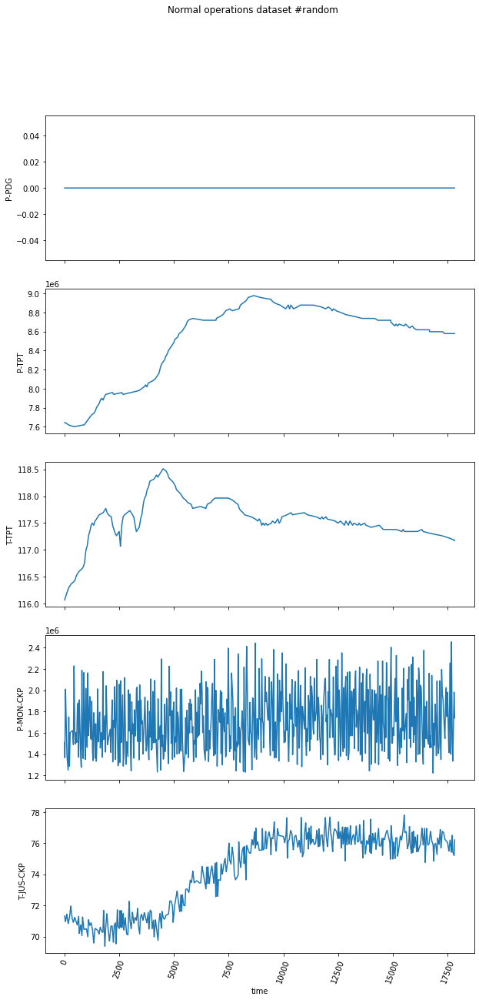

In [28]:
fig, ts = plt.subplots(5,figsize=(10,20),sharex = True)

fig.suptitle('Normal operations dataset #random')
ts[4].set_xlabel('time')
ts[0].set_ylabel("P-PDG")
ts[1].set_ylabel('P-TPT')
ts[2].set_ylabel('T-TPT')
ts[3].set_ylabel("P-MON-CKP")
ts[4].set_ylabel('T-JUS-CKP')

degrees = 70
plt.xticks(rotation=degrees)

ts[0].plot(sample_data_df.index, sample_data_df["P-PDG"])
ts[1].plot(sample_data_df.index, sample_data_df["P-TPT"])
ts[2].plot(sample_data_df.index, sample_data_df["T-TPT"])
ts[3].plot(sample_data_df.index, sample_data_df["P-MON-CKP"])
ts[4].plot(sample_data_df.index, sample_data_df["T-JUS-CKP"])

In [29]:
normal_df = normal_df.drop(naughty_list, axis=1)

In [30]:
signal = normal_df[6]
max_time_delay = 90
max_embedding_dimension = 15
stride = 1

signal = signal[::5]

optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
    signal, max_time_delay, max_embedding_dimension, stride=stride
    )
print(f"signal lenght: {len(signal)}")
print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")

embedding_dimension = optimal_embedding_dimension
embedding_time_delay = optimal_time_delay


embedder = SingleTakensEmbedding(
    parameters_type="fixed", n_jobs=-1, time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)

signal_embedded = embedder.fit_transform(signal)

pca = PCA(n_components=3)
signal_embedded_pca = pca.fit_transform(signal_embedded)

plot_point_cloud(signal_embedded_pca)

signal lenght: 408
Optimal embedding time delay based on mutual information: 21
Optimal embedding dimension based on false nearest neighbors: 8


Let's start by using one single value of embedding parameters for all the regular operation conditions time series. And see if there is any high-dimensional homology generator (dim=2).

In [31]:
def batch_analyzer(input_df, stride, max_embedding_dimension, max_time_delay):
    max_time_delay = int(max_time_delay)
    max_embedding_dimension = int(max_embedding_dimension)
    homology_dimensions = (0, 1)
    VRP = VietorisRipsPersistence(homology_dimensions=homology_dimensions)
    pca = PCA(n_components=3)
    PE_signal = PersistenceEntropy()
    PE_norm = PersistenceEntropy(normalize=True)

    entropies = []
    norm_entropies = []
    diagrams = []
    point_clouds_pca = []
    i = 0

    for timeserie in input_df:
        i += 1
        optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
            input_df[timeserie], max_time_delay, max_embedding_dimension, stride=stride
            )
        if optimal_embedding_dimension < 3:
            optimal_embedding_dimension = 3
            
        print('analyzing nr.',i, 'progress:',int(100*i/len(input_df.columns)),'%', 'dim',optimal_embedding_dimension,'delay', optimal_time_delay)

        embedder = SingleTakensEmbedding(
            parameters_type="fixed", n_jobs=6, time_delay=optimal_time_delay, dimension=optimal_embedding_dimension, stride=stride
            )

        y_signal_embedded = embedder.fit_transform(input_df[timeserie])
        y_signal_embedded_reshaped = y_signal_embedded.reshape(1, *y_signal_embedded.shape)
        y_signal_embedded_pca = pca.fit_transform(y_signal_embedded)

        X_diagram = VRP.fit_transform(y_signal_embedded_reshaped)
        features = PE_signal.fit_transform(X_diagram)
        features_norm = PE_norm.fit_transform(X_diagram)

        point_clouds_pca.append(y_signal_embedded_pca)
        entropies.append(features)
        norm_entropies.append(features_norm)
        diagrams.append(X_diagram)
    return(point_clouds_pca, diagrams, entropies, norm_entropies)

In [35]:
normal_point_clouds_pca, normal_diagrams, normal_entropies, normal_norm_entropies = batch_analyzer(normal_df, 2, 15, 70)

analyzing nr. 1 progress: 0 % dim 11 delay 66
analyzing nr. 2 progress: 0 % dim 8 delay 14
analyzing nr. 3 progress: 0 % dim 11 delay 67
analyzing nr. 4 progress: 0 % dim 9 delay 67
analyzing nr. 5 progress: 0 % dim 10 delay 70
analyzing nr. 6 progress: 1 % dim 11 delay 68
analyzing nr. 7 progress: 1 % dim 9 delay 63
analyzing nr. 8 progress: 1 % dim 5 delay 66
analyzing nr. 9 progress: 1 % dim 3 delay 70
analyzing nr. 10 progress: 1 % dim 10 delay 70
analyzing nr. 11 progress: 1 % dim 10 delay 18
analyzing nr. 12 progress: 2 % dim 10 delay 13
analyzing nr. 13 progress: 2 % dim 4 delay 70
analyzing nr. 14 progress: 2 % dim 13 delay 57
analyzing nr. 15 progress: 2 % dim 10 delay 70
analyzing nr. 16 progress: 2 % dim 11 delay 69
analyzing nr. 17 progress: 2 % dim 7 delay 48
analyzing nr. 18 progress: 3 % dim 11 delay 66
analyzing nr. 19 progress: 3 % dim 8 delay 70
analyzing nr. 20 progress: 3 % dim 12 delay 56
analyzing nr. 21 progress: 3 % dim 4 delay 68
analyzing nr. 22 progress: 3 % 

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:470: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 48 progress: 8 % dim 7 delay 65
analyzing nr. 49 progress: 8 % dim 5 delay 70
analyzing nr. 50 progress: 8 % dim 7 delay 70
analyzing nr. 51 progress: 8 % dim 4 delay 60
analyzing nr. 52 progress: 8 % dim 7 delay 68
analyzing nr. 53 progress: 9 % dim 4 delay 70
analyzing nr. 54 progress: 9 % dim 6 delay 64
analyzing nr. 55 progress: 9 % dim 3 delay 70
analyzing nr. 56 progress: 9 % dim 8 delay 70
analyzing nr. 57 progress: 9 % dim 6 delay 41
analyzing nr. 58 progress: 10 % dim 9 delay 70
analyzing nr. 59 progress: 10 % dim 6 delay 10
analyzing nr. 60 progress: 10 % dim 12 delay 63
analyzing nr. 61 progress: 10 % dim 6 delay 64
analyzing nr. 62 progress: 10 % dim 11 delay 22
analyzing nr. 63 progress: 10 % dim 6 delay 37
analyzing nr. 64 progress: 11 % dim 10 delay 70
analyzing nr. 65 progress: 11 % dim 5 delay 37
analyzing nr. 66 progress: 11 % dim 11 delay 70
analyzing nr. 67 progress: 11 % dim 7 delay 17
analyzing nr. 68 progress: 11 % dim 6 delay 22
analyzing nr. 69 pr

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:470: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 72 progress: 12 % dim 3 delay 70
analyzing nr. 73 progress: 12 % dim 5 delay 64
analyzing nr. 74 progress: 12 % dim 3 delay 45
analyzing nr. 75 progress: 12 % dim 11 delay 70
analyzing nr. 76 progress: 13 % dim 9 delay 70
analyzing nr. 77 progress: 13 % dim 6 delay 64
analyzing nr. 78 progress: 13 % dim 10 delay 63
analyzing nr. 79 progress: 13 % dim 9 delay 61
analyzing nr. 80 progress: 13 % dim 11 delay 68
analyzing nr. 81 progress: 14 % dim 11 delay 66
analyzing nr. 82 progress: 14 % dim 7 delay 66
analyzing nr. 83 progress: 14 % dim 8 delay 70
analyzing nr. 84 progress: 14 % dim 12 delay 61
analyzing nr. 85 progress: 14 % dim 6 delay 70
analyzing nr. 86 progress: 14 % dim 11 delay 65
analyzing nr. 87 progress: 15 % dim 13 delay 55
analyzing nr. 88 progress: 15 % dim 11 delay 69
analyzing nr. 89 progress: 15 % dim 11 delay 66
analyzing nr. 90 progress: 15 % dim 13 delay 50
analyzing nr. 91 progress: 15 % dim 9 delay 42
analyzing nr. 92 progress: 15 % dim 8 delay 69
ana

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:470: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 102 progress: 17 % dim 7 delay 59
analyzing nr. 103 progress: 17 % dim 10 delay 70
analyzing nr. 104 progress: 17 % dim 11 delay 68
analyzing nr. 105 progress: 18 % dim 11 delay 65
analyzing nr. 106 progress: 18 % dim 6 delay 50
analyzing nr. 107 progress: 18 % dim 10 delay 70
analyzing nr. 108 progress: 18 % dim 11 delay 69
analyzing nr. 109 progress: 18 % dim 5 delay 66
analyzing nr. 110 progress: 19 % dim 11 delay 70
analyzing nr. 111 progress: 19 % dim 6 delay 68
analyzing nr. 112 progress: 19 % dim 10 delay 59
analyzing nr. 113 progress: 19 % dim 11 delay 70
analyzing nr. 114 progress: 19 % dim 9 delay 70
analyzing nr. 115 progress: 19 % dim 11 delay 68
analyzing nr. 116 progress: 20 % dim 7 delay 61
analyzing nr. 117 progress: 20 % dim 11 delay 68
analyzing nr. 118 progress: 20 % dim 3 delay 1


/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:470: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 119 progress: 20 % dim 12 delay 60
analyzing nr. 120 progress: 20 % dim 11 delay 64
analyzing nr. 121 progress: 20 % dim 11 delay 64
analyzing nr. 122 progress: 21 % dim 3 delay 30
analyzing nr. 123 progress: 21 % dim 11 delay 70
analyzing nr. 124 progress: 21 % dim 7 delay 66
analyzing nr. 125 progress: 21 % dim 4 delay 70
analyzing nr. 126 progress: 21 % dim 7 delay 70
analyzing nr. 127 progress: 21 % dim 10 delay 68
analyzing nr. 128 progress: 22 % dim 7 delay 32
analyzing nr. 129 progress: 22 % dim 11 delay 70
analyzing nr. 130 progress: 22 % dim 11 delay 70
analyzing nr. 131 progress: 22 % dim 11 delay 68
analyzing nr. 132 progress: 22 % dim 7 delay 70
analyzing nr. 133 progress: 23 % dim 11 delay 70
analyzing nr. 134 progress: 23 % dim 3 delay 1


/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:470: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 135 progress: 23 % dim 12 delay 63
analyzing nr. 136 progress: 23 % dim 11 delay 69
analyzing nr. 137 progress: 23 % dim 9 delay 40
analyzing nr. 138 progress: 23 % dim 11 delay 70
analyzing nr. 139 progress: 24 % dim 6 delay 23
analyzing nr. 140 progress: 24 % dim 11 delay 64
analyzing nr. 141 progress: 24 % dim 6 delay 16
analyzing nr. 142 progress: 24 % dim 6 delay 65
analyzing nr. 143 progress: 24 % dim 6 delay 69
analyzing nr. 144 progress: 24 % dim 7 delay 36
analyzing nr. 145 progress: 25 % dim 12 delay 59
analyzing nr. 146 progress: 25 % dim 11 delay 63
analyzing nr. 147 progress: 25 % dim 3 delay 70
analyzing nr. 148 progress: 25 % dim 8 delay 61
analyzing nr. 149 progress: 25 % dim 9 delay 69
analyzing nr. 150 progress: 25 % dim 7 delay 69
analyzing nr. 151 progress: 26 % dim 5 delay 49
analyzing nr. 152 progress: 26 % dim 9 delay 68
analyzing nr. 153 progress: 26 % dim 5 delay 70
analyzing nr. 154 progress: 26 % dim 7 delay 48
analyzing nr. 155 progress: 26 % d

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:470: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 158 progress: 27 % dim 12 delay 49
analyzing nr. 159 progress: 27 % dim 8 delay 24
analyzing nr. 160 progress: 27 % dim 7 delay 68
analyzing nr. 161 progress: 27 % dim 6 delay 60
analyzing nr. 162 progress: 28 % dim 7 delay 68
analyzing nr. 163 progress: 28 % dim 11 delay 67
analyzing nr. 164 progress: 28 % dim 14 delay 23
analyzing nr. 165 progress: 28 % dim 11 delay 70
analyzing nr. 166 progress: 28 % dim 11 delay 38
analyzing nr. 167 progress: 28 % dim 10 delay 70
analyzing nr. 168 progress: 29 % dim 9 delay 68
analyzing nr. 169 progress: 29 % dim 6 delay 34
analyzing nr. 170 progress: 29 % dim 11 delay 65
analyzing nr. 171 progress: 29 % dim 13 delay 55
analyzing nr. 172 progress: 29 % dim 14 delay 51
analyzing nr. 173 progress: 29 % dim 3 delay 1


/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:470: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 174 progress: 30 % dim 9 delay 68
analyzing nr. 175 progress: 30 % dim 6 delay 56
analyzing nr. 176 progress: 30 % dim 8 delay 17
analyzing nr. 177 progress: 30 % dim 10 delay 70
analyzing nr. 178 progress: 30 % dim 7 delay 25
analyzing nr. 179 progress: 30 % dim 6 delay 57
analyzing nr. 180 progress: 31 % dim 8 delay 63
analyzing nr. 181 progress: 31 % dim 11 delay 70
analyzing nr. 182 progress: 31 % dim 11 delay 67
analyzing nr. 183 progress: 31 % dim 13 delay 54
analyzing nr. 184 progress: 31 % dim 11 delay 37
analyzing nr. 185 progress: 32 % dim 14 delay 51
analyzing nr. 186 progress: 32 % dim 7 delay 65
analyzing nr. 187 progress: 32 % dim 8 delay 67
analyzing nr. 188 progress: 32 % dim 9 delay 68
analyzing nr. 189 progress: 32 % dim 6 delay 9
analyzing nr. 190 progress: 32 % dim 10 delay 40
analyzing nr. 191 progress: 33 % dim 9 delay 47
analyzing nr. 192 progress: 33 % dim 9 delay 70
analyzing nr. 193 progress: 33 % dim 8 delay 70
analyzing nr. 194 progress: 33 % d

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:470: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 216 progress: 37 % dim 6 delay 46
analyzing nr. 217 progress: 37 % dim 11 delay 67
analyzing nr. 218 progress: 37 % dim 3 delay 58
analyzing nr. 219 progress: 37 % dim 10 delay 67
analyzing nr. 220 progress: 38 % dim 11 delay 70
analyzing nr. 221 progress: 38 % dim 4 delay 54
analyzing nr. 222 progress: 38 % dim 6 delay 23
analyzing nr. 223 progress: 38 % dim 6 delay 37
analyzing nr. 224 progress: 38 % dim 8 delay 63
analyzing nr. 225 progress: 38 % dim 7 delay 68
analyzing nr. 226 progress: 39 % dim 7 delay 29
analyzing nr. 227 progress: 39 % dim 12 delay 63
analyzing nr. 228 progress: 39 % dim 13 delay 55
analyzing nr. 229 progress: 39 % dim 7 delay 63
analyzing nr. 230 progress: 39 % dim 4 delay 47
analyzing nr. 231 progress: 39 % dim 3 delay 70
analyzing nr. 232 progress: 40 % dim 9 delay 43
analyzing nr. 233 progress: 40 % dim 9 delay 55
analyzing nr. 234 progress: 40 % dim 9 delay 69
analyzing nr. 235 progress: 40 % dim 5 delay 65
analyzing nr. 236 progress: 40 % di

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:470: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 242 progress: 41 % dim 11 delay 65
analyzing nr. 243 progress: 42 % dim 11 delay 70
analyzing nr. 244 progress: 42 % dim 3 delay 63
analyzing nr. 245 progress: 42 % dim 11 delay 69
analyzing nr. 246 progress: 42 % dim 7 delay 70
analyzing nr. 247 progress: 42 % dim 9 delay 70
analyzing nr. 248 progress: 42 % dim 11 delay 69
analyzing nr. 249 progress: 43 % dim 11 delay 70
analyzing nr. 250 progress: 43 % dim 6 delay 70
analyzing nr. 251 progress: 43 % dim 10 delay 63
analyzing nr. 252 progress: 43 % dim 6 delay 69
analyzing nr. 253 progress: 43 % dim 6 delay 66
analyzing nr. 254 progress: 43 % dim 11 delay 70
analyzing nr. 255 progress: 44 % dim 11 delay 70
analyzing nr. 256 progress: 44 % dim 10 delay 70
analyzing nr. 257 progress: 44 % dim 11 delay 70
analyzing nr. 258 progress: 44 % dim 11 delay 70
analyzing nr. 259 progress: 44 % dim 5 delay 33
analyzing nr. 260 progress: 44 % dim 5 delay 67
analyzing nr. 261 progress: 45 % dim 7 delay 67
analyzing nr. 262 progress: 4

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:470: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 272 progress: 47 % dim 10 delay 70
analyzing nr. 273 progress: 47 % dim 8 delay 70
analyzing nr. 274 progress: 47 % dim 8 delay 70
analyzing nr. 275 progress: 47 % dim 6 delay 41
analyzing nr. 276 progress: 47 % dim 10 delay 70
analyzing nr. 277 progress: 47 % dim 7 delay 51
analyzing nr. 278 progress: 48 % dim 9 delay 70
analyzing nr. 279 progress: 48 % dim 11 delay 67
analyzing nr. 280 progress: 48 % dim 6 delay 60
analyzing nr. 281 progress: 48 % dim 4 delay 60
analyzing nr. 282 progress: 48 % dim 7 delay 32
analyzing nr. 283 progress: 48 % dim 3 delay 1


/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:470: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 284 progress: 49 % dim 8 delay 14
analyzing nr. 285 progress: 49 % dim 6 delay 46
analyzing nr. 286 progress: 49 % dim 6 delay 29
analyzing nr. 287 progress: 49 % dim 5 delay 66
analyzing nr. 288 progress: 49 % dim 12 delay 59
analyzing nr. 289 progress: 50 % dim 7 delay 34
analyzing nr. 290 progress: 50 % dim 7 delay 25
analyzing nr. 291 progress: 50 % dim 3 delay 68
analyzing nr. 292 progress: 50 % dim 4 delay 70
analyzing nr. 293 progress: 50 % dim 8 delay 31
analyzing nr. 294 progress: 50 % dim 10 delay 70
analyzing nr. 295 progress: 51 % dim 9 delay 70
analyzing nr. 296 progress: 51 % dim 13 delay 57
analyzing nr. 297 progress: 51 % dim 7 delay 62
analyzing nr. 298 progress: 51 % dim 11 delay 68
analyzing nr. 299 progress: 51 % dim 9 delay 69
analyzing nr. 300 progress: 51 % dim 10 delay 68
analyzing nr. 301 progress: 52 % dim 7 delay 21
analyzing nr. 302 progress: 52 % dim 11 delay 70
analyzing nr. 303 progress: 52 % dim 11 delay 68
analyzing nr. 304 progress: 52 % 

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:470: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 336 progress: 58 % dim 8 delay 70
analyzing nr. 337 progress: 58 % dim 12 delay 56
analyzing nr. 338 progress: 58 % dim 8 delay 70
analyzing nr. 339 progress: 58 % dim 9 delay 70
analyzing nr. 340 progress: 58 % dim 6 delay 11
analyzing nr. 341 progress: 58 % dim 7 delay 34
analyzing nr. 342 progress: 59 % dim 12 delay 63
analyzing nr. 343 progress: 59 % dim 4 delay 70
analyzing nr. 344 progress: 59 % dim 12 delay 63
analyzing nr. 345 progress: 59 % dim 10 delay 70
analyzing nr. 346 progress: 59 % dim 6 delay 14
analyzing nr. 347 progress: 60 % dim 10 delay 63
analyzing nr. 348 progress: 60 % dim 8 delay 48
analyzing nr. 349 progress: 60 % dim 5 delay 59
analyzing nr. 350 progress: 60 % dim 8 delay 70
analyzing nr. 351 progress: 60 % dim 13 delay 57
analyzing nr. 352 progress: 60 % dim 6 delay 62
analyzing nr. 353 progress: 61 % dim 12 delay 61
analyzing nr. 354 progress: 61 % dim 5 delay 66
analyzing nr. 355 progress: 61 % dim 11 delay 66
analyzing nr. 356 progress: 61 %

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:470: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 386 progress: 66 % dim 7 delay 69
analyzing nr. 387 progress: 66 % dim 7 delay 47
analyzing nr. 388 progress: 67 % dim 11 delay 69
analyzing nr. 389 progress: 67 % dim 9 delay 70
analyzing nr. 390 progress: 67 % dim 11 delay 70
analyzing nr. 391 progress: 67 % dim 5 delay 27
analyzing nr. 392 progress: 67 % dim 11 delay 69
analyzing nr. 393 progress: 67 % dim 11 delay 68
analyzing nr. 394 progress: 68 % dim 11 delay 64
analyzing nr. 395 progress: 68 % dim 11 delay 64
analyzing nr. 396 progress: 68 % dim 6 delay 18
analyzing nr. 397 progress: 68 % dim 13 delay 47
analyzing nr. 398 progress: 68 % dim 8 delay 68
analyzing nr. 399 progress: 69 % dim 6 delay 54
analyzing nr. 400 progress: 69 % dim 7 delay 69
analyzing nr. 401 progress: 69 % dim 6 delay 69
analyzing nr. 402 progress: 69 % dim 4 delay 70
analyzing nr. 403 progress: 69 % dim 8 delay 23
analyzing nr. 404 progress: 69 % dim 11 delay 70
analyzing nr. 405 progress: 70 % dim 12 delay 63
analyzing nr. 406 progress: 70 

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:470: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 449 progress: 77 % dim 10 delay 70
analyzing nr. 450 progress: 77 % dim 10 delay 46
analyzing nr. 451 progress: 78 % dim 11 delay 70
analyzing nr. 452 progress: 78 % dim 11 delay 69
analyzing nr. 453 progress: 78 % dim 11 delay 52
analyzing nr. 454 progress: 78 % dim 10 delay 69
analyzing nr. 455 progress: 78 % dim 7 delay 68
analyzing nr. 456 progress: 78 % dim 11 delay 69
analyzing nr. 457 progress: 79 % dim 8 delay 70
analyzing nr. 458 progress: 79 % dim 10 delay 70
analyzing nr. 459 progress: 79 % dim 6 delay 66
analyzing nr. 460 progress: 79 % dim 13 delay 17
analyzing nr. 461 progress: 79 % dim 10 delay 60
analyzing nr. 462 progress: 79 % dim 7 delay 39
analyzing nr. 463 progress: 80 % dim 11 delay 65
analyzing nr. 464 progress: 80 % dim 11 delay 70
analyzing nr. 465 progress: 80 % dim 6 delay 25
analyzing nr. 466 progress: 80 % dim 6 delay 32
analyzing nr. 467 progress: 80 % dim 4 delay 56
analyzing nr. 468 progress: 80 % dim 7 delay 20
analyzing nr. 469 progress: 

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:470: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 499 progress: 86 % dim 6 delay 70
analyzing nr. 500 progress: 86 % dim 10 delay 68
analyzing nr. 501 progress: 86 % dim 5 delay 43
analyzing nr. 502 progress: 86 % dim 14 delay 51
analyzing nr. 503 progress: 87 % dim 5 delay 36
analyzing nr. 504 progress: 87 % dim 11 delay 65
analyzing nr. 505 progress: 87 % dim 11 delay 69
analyzing nr. 506 progress: 87 % dim 4 delay 70
analyzing nr. 507 progress: 87 % dim 3 delay 70
analyzing nr. 508 progress: 87 % dim 11 delay 67
analyzing nr. 509 progress: 88 % dim 11 delay 69
analyzing nr. 510 progress: 88 % dim 10 delay 70
analyzing nr. 511 progress: 88 % dim 9 delay 62
analyzing nr. 512 progress: 88 % dim 11 delay 67
analyzing nr. 513 progress: 88 % dim 10 delay 70
analyzing nr. 514 progress: 88 % dim 10 delay 70
analyzing nr. 515 progress: 89 % dim 4 delay 50
analyzing nr. 516 progress: 89 % dim 11 delay 69
analyzing nr. 517 progress: 89 % dim 8 delay 25
analyzing nr. 518 progress: 89 % dim 11 delay 70
analyzing nr. 519 progress: 

In [36]:
tmp = normal_entropies
Entropy_H0 = []
Entropy_H1 = []

for item in tmp:
    Entropy_H0.append(item[0][0])
    Entropy_H1.append(item[0][1])

Entropy_H1_series = pd.Series(Entropy_H1)

In [37]:
tmp = normal_norm_entropies
Entropy_H0_norm = []
Entropy_H1_norm = []

for item in tmp:
    Entropy_H0_norm.append(item[0][0])
    Entropy_H1_norm.append(item[0][1])

Entropy_H1_norm_series = pd.Series(Entropy_H1_norm)

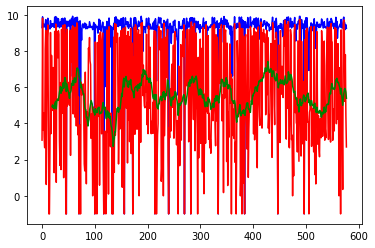

In [38]:
plt.plot(Entropy_H0, 'b-')
plt.plot(Entropy_H1, 'r-')
plt.plot(Entropy_H1_series.rolling(20).mean(), 'g-')

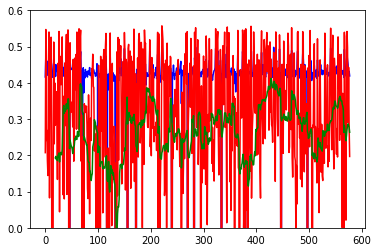

In [39]:
plt.plot(Entropy_H0_norm, 'b-')
plt.plot(Entropy_H1_norm, 'r-')
plt.ylim([0,0.6])
plt.plot(Entropy_H1_norm_series.rolling(20).mean(), 'g-')

So, entropies (non-normalized) are clustered around 10 for H0 generators, and 6 for H1 generators with the latter having a much larger variance. 

Looking more carefully at the timeseries, we can see that those that give the most problems are those who are monotonically increasing or decreasing. 

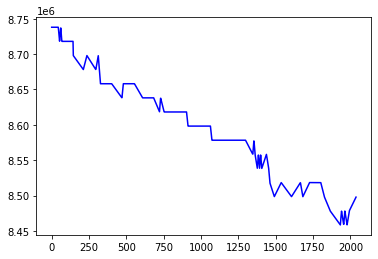

In [68]:
plt.plot(normal_df[442], 'b-')

In [69]:
plot_point_cloud(normal_point_clouds_pca[442])

In [71]:
VRP.plot(normal_diagrams[442])

In [72]:
print('Entropy for timeseries #442:', Entropy_H0[442], Entropy_H1[442])

Entropy for timeseries #442: 9.656013020583922 8.570353333022272


These have some high persistency H1 points, probably due to some dynamics that is not evident at this scale. Other low-entropy time series have some sort of dynamic, and we argue that they may not be entirely classified correctly as normal operations.

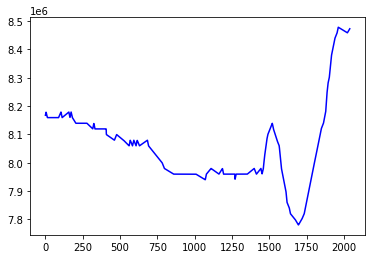

In [73]:
plt.plot(normal_df[114], 'b-')

In [75]:
VRP.plot(normal_diagrams[114])

In [76]:
print('Entropy for timeseries #114:', Entropy_H0[114], Entropy_H1[114])

Entropy for timeseries #114: 9.351806806111652 8.593376110952418


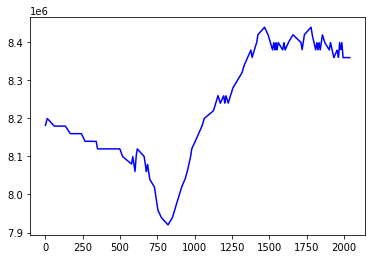

In [77]:
plt.plot(normal_df[491], 'b-')

In [78]:
plot_point_cloud(normal_point_clouds_pca[491])

In [80]:
VRP.plot(normal_diagrams[491])

In [81]:
print('Entropy for timeseries #25:', Entropy_H0[491], Entropy_H1[491])

Entropy for timeseries #25: 7.949347503876445 2.195757455168265


Other stationary time series show instead no high persistence points and more high entropy (around 10) for both H0 and H1 generators. 

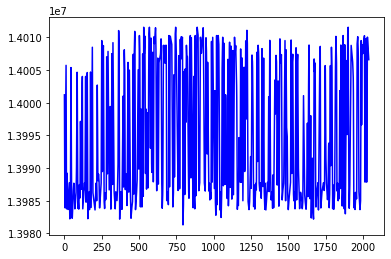

In [82]:
plt.plot(normal_df[25], 'b-')

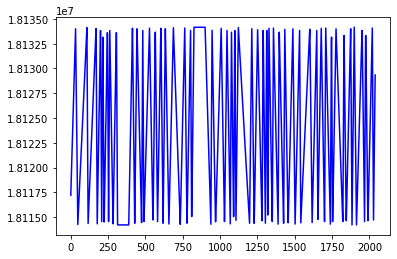

In [83]:
plt.plot(normal_df[509], 'b-')

freq units: 4.904365E-05 Hz


<AxesSubplot:xlabel='BHP', ylabel='count'>

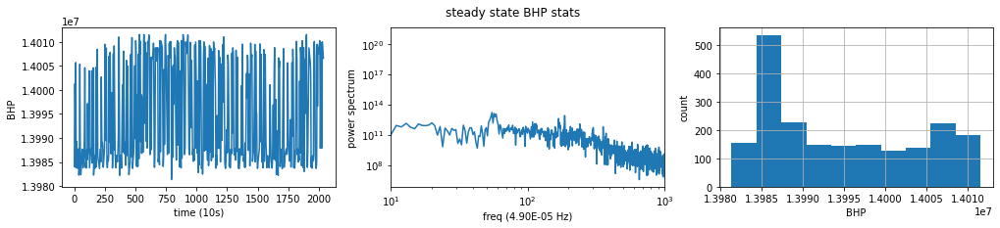

In [84]:
fig_ss_analysis, data = plt.subplots(1, 3, figsize=(17, 3))

from random import gauss
from random import seed
from pandas.plotting import autocorrelation_plot
from statsmodels.graphics.gofplots import qqplot

freq_units = 0.1/len(normal_df[389])
print('freq units: %(units)4E Hz' %{"units":(freq_units)})

fig_ss_analysis.suptitle('steady state BHP stats')
data[0].set_xlabel('time (10s)')
data[0].set_ylabel('BHP')
data[1].set_xlabel('freq (%(units).2E Hz)' %{"units":(freq_units)})
data[1].set_ylabel('power spectrum')
data[2].set_xlabel('BHP')
data[2].set_ylabel('count')

data[1].set_xlim(10,1000)
#data[1].set_ylim(0,1E013)
data[1].set_yscale('log')
data[1].set_xscale('log')

ss_BHP = normal_df[25]

fft_ss = np.fft.rfft(ss_BHP)
fft_ss_abs = np.abs(fft_ss)
power_spectrum_ss = np.square(fft_ss_abs)


data[0].plot(ss_BHP)
data[1].plot(power_spectrum_ss)
ss_BHP.hist()

In [85]:
plot_point_cloud(normal_point_clouds_pca[509])

In [87]:
VRP.plot(normal_diagrams[509])

In [337]:
print('Entropy for timeseries #25:', Entropy_H0[25], Entropy_H1[25])

Entropy for timeseries #25: 10.296608055849124 9.515581674047807


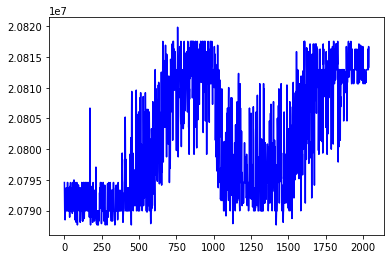

In [88]:
plt.plot(normal_df[189], 'b-')

In [89]:
print('Entropy for timeseries #25:', Entropy_H0[189], Entropy_H1[189])

Entropy for timeseries #25: 9.669080006595825 9.186787648426238


Note that jumps in the mean of the time serie do not affect the persistence diagram nor the entropy of the embedded time series.

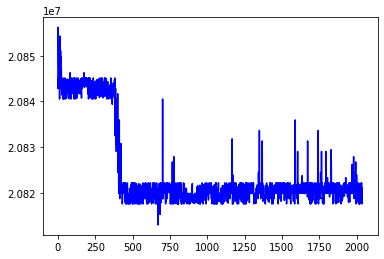

In [90]:
plt.plot(normal_df[188], 'b-')

In [91]:
plot_point_cloud(normal_point_clouds_pca[188])

In [93]:
VRP.plot(normal_diagrams[188])

In [107]:
normal_df.shape

(2039, 578)

In [108]:
print('Entropy for timeseries #25:', Entropy_H0[188], Entropy_H1[188])

Entropy for timeseries #25: 9.914011970972606 9.530825185704773


TBH when the parameters are optimized for each time series, it is difficult to analize them consistently. I then try to run the same by choosing (guessing) some sort of universal parameters.

In [114]:
def batch_analyzerFIX(input_df, stride, embedding_dimension, time_delay):
   
    print('shape of dataset:', input_df.shape)
    homology_dimensions = (0, 1)
    VRP = VietorisRipsPersistence(homology_dimensions=homology_dimensions)
    pca = PCA(n_components=3)
    PE_signal = PersistenceEntropy()
    PE_norm = PersistenceEntropy(normalize=True)

    entropies = []
    norm_entropies = []
    diagrams = []
    point_clouds_pca = []
    i = 0

    for timeserie in input_df:
        i += 1
           
        print('analyzing nr.',i, 'progress:',int(100*i/len(input_df.columns)),'%')

        embedder = SingleTakensEmbedding(
            parameters_type="fixed", n_jobs=6, time_delay=time_delay, dimension=embedding_dimension, stride=stride
            )

        y_signal_embedded = embedder.fit_transform(input_df[timeserie][::1]) 
        y_signal_embedded_reshaped = y_signal_embedded.reshape(1, *y_signal_embedded.shape)
        y_signal_embedded_pca = pca.fit_transform(y_signal_embedded)

        X_diagram = VRP.fit_transform(y_signal_embedded_reshaped)
        features = PE_signal.fit_transform(X_diagram)
        features_norm = PE_norm.fit_transform(X_diagram)

        point_clouds_pca.append(y_signal_embedded_pca)
        entropies.append(features)
        norm_entropies.append(features_norm)
        diagrams.append(X_diagram)
    return(point_clouds_pca, diagrams, entropies, norm_entropies)

In [115]:
normal_point_clouds_pcaFIX, normal_diagramsFIX, normal_entropiesFIX, normal_norm_entropiesFIX = batch_analyzerFIX(normal_df, 2, 11, 70)

shape of dataset: (2039, 578)
analyzing nr. 1 progress: 0 %
analyzing nr. 2 progress: 0 %
analyzing nr. 3 progress: 0 %
analyzing nr. 4 progress: 0 %
analyzing nr. 5 progress: 0 %
analyzing nr. 6 progress: 1 %
analyzing nr. 7 progress: 1 %
analyzing nr. 8 progress: 1 %
analyzing nr. 9 progress: 1 %
analyzing nr. 10 progress: 1 %
analyzing nr. 11 progress: 1 %
analyzing nr. 12 progress: 2 %
analyzing nr. 13 progress: 2 %
analyzing nr. 14 progress: 2 %
analyzing nr. 15 progress: 2 %
analyzing nr. 16 progress: 2 %
analyzing nr. 17 progress: 2 %
analyzing nr. 18 progress: 3 %
analyzing nr. 19 progress: 3 %
analyzing nr. 20 progress: 3 %
analyzing nr. 21 progress: 3 %
analyzing nr. 22 progress: 3 %
analyzing nr. 23 progress: 3 %
analyzing nr. 24 progress: 4 %
analyzing nr. 25 progress: 4 %
analyzing nr. 26 progress: 4 %
analyzing nr. 27 progress: 4 %
analyzing nr. 28 progress: 4 %
analyzing nr. 29 progress: 5 %
analyzing nr. 30 progress: 5 %
analyzing nr. 31 progress: 5 %
analyzing nr. 32 p

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:561: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 49 progress: 8 %
analyzing nr. 50 progress: 8 %
analyzing nr. 51 progress: 8 %
analyzing nr. 52 progress: 8 %
analyzing nr. 53 progress: 9 %
analyzing nr. 54 progress: 9 %
analyzing nr. 55 progress: 9 %
analyzing nr. 56 progress: 9 %
analyzing nr. 57 progress: 9 %
analyzing nr. 58 progress: 10 %
analyzing nr. 59 progress: 10 %
analyzing nr. 60 progress: 10 %
analyzing nr. 61 progress: 10 %
analyzing nr. 62 progress: 10 %
analyzing nr. 63 progress: 10 %
analyzing nr. 64 progress: 11 %
analyzing nr. 65 progress: 11 %
analyzing nr. 66 progress: 11 %
analyzing nr. 67 progress: 11 %
analyzing nr. 68 progress: 11 %
analyzing nr. 69 progress: 11 %
analyzing nr. 70 progress: 12 %
analyzing nr. 71 progress: 12 %
analyzing nr. 72 progress: 12 %


/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:561: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 73 progress: 12 %
analyzing nr. 74 progress: 12 %
analyzing nr. 75 progress: 12 %
analyzing nr. 76 progress: 13 %
analyzing nr. 77 progress: 13 %
analyzing nr. 78 progress: 13 %
analyzing nr. 79 progress: 13 %
analyzing nr. 80 progress: 13 %
analyzing nr. 81 progress: 14 %
analyzing nr. 82 progress: 14 %
analyzing nr. 83 progress: 14 %
analyzing nr. 84 progress: 14 %
analyzing nr. 85 progress: 14 %
analyzing nr. 86 progress: 14 %
analyzing nr. 87 progress: 15 %
analyzing nr. 88 progress: 15 %
analyzing nr. 89 progress: 15 %
analyzing nr. 90 progress: 15 %
analyzing nr. 91 progress: 15 %
analyzing nr. 92 progress: 15 %
analyzing nr. 93 progress: 16 %
analyzing nr. 94 progress: 16 %
analyzing nr. 95 progress: 16 %
analyzing nr. 96 progress: 16 %
analyzing nr. 97 progress: 16 %
analyzing nr. 98 progress: 16 %
analyzing nr. 99 progress: 17 %
analyzing nr. 100 progress: 17 %
analyzing nr. 101 progress: 17 %


/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:561: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 102 progress: 17 %
analyzing nr. 103 progress: 17 %
analyzing nr. 104 progress: 17 %
analyzing nr. 105 progress: 18 %
analyzing nr. 106 progress: 18 %
analyzing nr. 107 progress: 18 %
analyzing nr. 108 progress: 18 %
analyzing nr. 109 progress: 18 %
analyzing nr. 110 progress: 19 %
analyzing nr. 111 progress: 19 %
analyzing nr. 112 progress: 19 %
analyzing nr. 113 progress: 19 %
analyzing nr. 114 progress: 19 %
analyzing nr. 115 progress: 19 %
analyzing nr. 116 progress: 20 %
analyzing nr. 117 progress: 20 %
analyzing nr. 118 progress: 20 %


/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:561: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 119 progress: 20 %
analyzing nr. 120 progress: 20 %
analyzing nr. 121 progress: 20 %
analyzing nr. 122 progress: 21 %
analyzing nr. 123 progress: 21 %
analyzing nr. 124 progress: 21 %
analyzing nr. 125 progress: 21 %
analyzing nr. 126 progress: 21 %
analyzing nr. 127 progress: 21 %
analyzing nr. 128 progress: 22 %
analyzing nr. 129 progress: 22 %
analyzing nr. 130 progress: 22 %
analyzing nr. 131 progress: 22 %
analyzing nr. 132 progress: 22 %
analyzing nr. 133 progress: 23 %
analyzing nr. 134 progress: 23 %
analyzing nr. 135 progress: 23 %


/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:561: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 136 progress: 23 %
analyzing nr. 137 progress: 23 %
analyzing nr. 138 progress: 23 %
analyzing nr. 139 progress: 24 %
analyzing nr. 140 progress: 24 %
analyzing nr. 141 progress: 24 %
analyzing nr. 142 progress: 24 %
analyzing nr. 143 progress: 24 %
analyzing nr. 144 progress: 24 %
analyzing nr. 145 progress: 25 %
analyzing nr. 146 progress: 25 %
analyzing nr. 147 progress: 25 %
analyzing nr. 148 progress: 25 %
analyzing nr. 149 progress: 25 %
analyzing nr. 150 progress: 25 %
analyzing nr. 151 progress: 26 %
analyzing nr. 152 progress: 26 %
analyzing nr. 153 progress: 26 %
analyzing nr. 154 progress: 26 %
analyzing nr. 155 progress: 26 %
analyzing nr. 156 progress: 26 %
analyzing nr. 157 progress: 27 %
analyzing nr. 158 progress: 27 %


/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:561: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 159 progress: 27 %
analyzing nr. 160 progress: 27 %
analyzing nr. 161 progress: 27 %
analyzing nr. 162 progress: 28 %
analyzing nr. 163 progress: 28 %
analyzing nr. 164 progress: 28 %
analyzing nr. 165 progress: 28 %
analyzing nr. 166 progress: 28 %
analyzing nr. 167 progress: 28 %
analyzing nr. 168 progress: 29 %
analyzing nr. 169 progress: 29 %
analyzing nr. 170 progress: 29 %
analyzing nr. 171 progress: 29 %
analyzing nr. 172 progress: 29 %
analyzing nr. 173 progress: 29 %
analyzing nr. 174 progress: 30 %


/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:561: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 175 progress: 30 %
analyzing nr. 176 progress: 30 %
analyzing nr. 177 progress: 30 %
analyzing nr. 178 progress: 30 %
analyzing nr. 179 progress: 30 %
analyzing nr. 180 progress: 31 %
analyzing nr. 181 progress: 31 %
analyzing nr. 182 progress: 31 %
analyzing nr. 183 progress: 31 %
analyzing nr. 184 progress: 31 %
analyzing nr. 185 progress: 32 %
analyzing nr. 186 progress: 32 %
analyzing nr. 187 progress: 32 %
analyzing nr. 188 progress: 32 %
analyzing nr. 189 progress: 32 %
analyzing nr. 190 progress: 32 %
analyzing nr. 191 progress: 33 %
analyzing nr. 192 progress: 33 %
analyzing nr. 193 progress: 33 %
analyzing nr. 194 progress: 33 %
analyzing nr. 195 progress: 33 %
analyzing nr. 196 progress: 33 %
analyzing nr. 197 progress: 34 %
analyzing nr. 198 progress: 34 %
analyzing nr. 199 progress: 34 %
analyzing nr. 200 progress: 34 %
analyzing nr. 201 progress: 34 %
analyzing nr. 202 progress: 34 %
analyzing nr. 203 progress: 35 %
analyzing nr. 204 progress: 35 %
analyzing 

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:561: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 217 progress: 37 %
analyzing nr. 218 progress: 37 %
analyzing nr. 219 progress: 37 %
analyzing nr. 220 progress: 38 %
analyzing nr. 221 progress: 38 %
analyzing nr. 222 progress: 38 %
analyzing nr. 223 progress: 38 %
analyzing nr. 224 progress: 38 %
analyzing nr. 225 progress: 38 %
analyzing nr. 226 progress: 39 %
analyzing nr. 227 progress: 39 %
analyzing nr. 228 progress: 39 %
analyzing nr. 229 progress: 39 %
analyzing nr. 230 progress: 39 %
analyzing nr. 231 progress: 39 %
analyzing nr. 232 progress: 40 %
analyzing nr. 233 progress: 40 %
analyzing nr. 234 progress: 40 %
analyzing nr. 235 progress: 40 %
analyzing nr. 236 progress: 40 %
analyzing nr. 237 progress: 41 %
analyzing nr. 238 progress: 41 %
analyzing nr. 239 progress: 41 %
analyzing nr. 240 progress: 41 %
analyzing nr. 241 progress: 41 %
analyzing nr. 242 progress: 41 %


/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:561: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 243 progress: 42 %
analyzing nr. 244 progress: 42 %
analyzing nr. 245 progress: 42 %
analyzing nr. 246 progress: 42 %
analyzing nr. 247 progress: 42 %
analyzing nr. 248 progress: 42 %
analyzing nr. 249 progress: 43 %
analyzing nr. 250 progress: 43 %
analyzing nr. 251 progress: 43 %
analyzing nr. 252 progress: 43 %
analyzing nr. 253 progress: 43 %
analyzing nr. 254 progress: 43 %
analyzing nr. 255 progress: 44 %
analyzing nr. 256 progress: 44 %
analyzing nr. 257 progress: 44 %
analyzing nr. 258 progress: 44 %
analyzing nr. 259 progress: 44 %
analyzing nr. 260 progress: 44 %
analyzing nr. 261 progress: 45 %
analyzing nr. 262 progress: 45 %
analyzing nr. 263 progress: 45 %
analyzing nr. 264 progress: 45 %
analyzing nr. 265 progress: 45 %
analyzing nr. 266 progress: 46 %
analyzing nr. 267 progress: 46 %
analyzing nr. 268 progress: 46 %
analyzing nr. 269 progress: 46 %
analyzing nr. 270 progress: 46 %
analyzing nr. 271 progress: 46 %
analyzing nr. 272 progress: 47 %


/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:561: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 273 progress: 47 %
analyzing nr. 274 progress: 47 %
analyzing nr. 275 progress: 47 %
analyzing nr. 276 progress: 47 %
analyzing nr. 277 progress: 47 %
analyzing nr. 278 progress: 48 %
analyzing nr. 279 progress: 48 %
analyzing nr. 280 progress: 48 %
analyzing nr. 281 progress: 48 %
analyzing nr. 282 progress: 48 %
analyzing nr. 283 progress: 48 %
analyzing nr. 284 progress: 49 %


/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:561: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 285 progress: 49 %
analyzing nr. 286 progress: 49 %
analyzing nr. 287 progress: 49 %
analyzing nr. 288 progress: 49 %
analyzing nr. 289 progress: 50 %
analyzing nr. 290 progress: 50 %
analyzing nr. 291 progress: 50 %
analyzing nr. 292 progress: 50 %
analyzing nr. 293 progress: 50 %
analyzing nr. 294 progress: 50 %
analyzing nr. 295 progress: 51 %
analyzing nr. 296 progress: 51 %
analyzing nr. 297 progress: 51 %
analyzing nr. 298 progress: 51 %
analyzing nr. 299 progress: 51 %
analyzing nr. 300 progress: 51 %
analyzing nr. 301 progress: 52 %
analyzing nr. 302 progress: 52 %
analyzing nr. 303 progress: 52 %
analyzing nr. 304 progress: 52 %
analyzing nr. 305 progress: 52 %
analyzing nr. 306 progress: 52 %
analyzing nr. 307 progress: 53 %
analyzing nr. 308 progress: 53 %
analyzing nr. 309 progress: 53 %
analyzing nr. 310 progress: 53 %
analyzing nr. 311 progress: 53 %
analyzing nr. 312 progress: 53 %
analyzing nr. 313 progress: 54 %
analyzing nr. 314 progress: 54 %
analyzing 

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:561: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 337 progress: 58 %
analyzing nr. 338 progress: 58 %
analyzing nr. 339 progress: 58 %
analyzing nr. 340 progress: 58 %
analyzing nr. 341 progress: 58 %
analyzing nr. 342 progress: 59 %
analyzing nr. 343 progress: 59 %
analyzing nr. 344 progress: 59 %
analyzing nr. 345 progress: 59 %
analyzing nr. 346 progress: 59 %
analyzing nr. 347 progress: 60 %
analyzing nr. 348 progress: 60 %
analyzing nr. 349 progress: 60 %
analyzing nr. 350 progress: 60 %
analyzing nr. 351 progress: 60 %
analyzing nr. 352 progress: 60 %
analyzing nr. 353 progress: 61 %
analyzing nr. 354 progress: 61 %
analyzing nr. 355 progress: 61 %
analyzing nr. 356 progress: 61 %
analyzing nr. 357 progress: 61 %
analyzing nr. 358 progress: 61 %
analyzing nr. 359 progress: 62 %
analyzing nr. 360 progress: 62 %
analyzing nr. 361 progress: 62 %
analyzing nr. 362 progress: 62 %
analyzing nr. 363 progress: 62 %
analyzing nr. 364 progress: 62 %
analyzing nr. 365 progress: 63 %
analyzing nr. 366 progress: 63 %
analyzing 

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:561: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 386 progress: 66 %
analyzing nr. 387 progress: 66 %
analyzing nr. 388 progress: 67 %
analyzing nr. 389 progress: 67 %
analyzing nr. 390 progress: 67 %
analyzing nr. 391 progress: 67 %
analyzing nr. 392 progress: 67 %
analyzing nr. 393 progress: 67 %
analyzing nr. 394 progress: 68 %
analyzing nr. 395 progress: 68 %
analyzing nr. 396 progress: 68 %
analyzing nr. 397 progress: 68 %
analyzing nr. 398 progress: 68 %
analyzing nr. 399 progress: 69 %
analyzing nr. 400 progress: 69 %
analyzing nr. 401 progress: 69 %
analyzing nr. 402 progress: 69 %
analyzing nr. 403 progress: 69 %
analyzing nr. 404 progress: 69 %
analyzing nr. 405 progress: 70 %
analyzing nr. 406 progress: 70 %
analyzing nr. 407 progress: 70 %
analyzing nr. 408 progress: 70 %
analyzing nr. 409 progress: 70 %
analyzing nr. 410 progress: 70 %
analyzing nr. 411 progress: 71 %
analyzing nr. 412 progress: 71 %
analyzing nr. 413 progress: 71 %
analyzing nr. 414 progress: 71 %
analyzing nr. 415 progress: 71 %
analyzing 

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:561: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 449 progress: 77 %
analyzing nr. 450 progress: 77 %
analyzing nr. 451 progress: 78 %
analyzing nr. 452 progress: 78 %
analyzing nr. 453 progress: 78 %
analyzing nr. 454 progress: 78 %
analyzing nr. 455 progress: 78 %
analyzing nr. 456 progress: 78 %
analyzing nr. 457 progress: 79 %
analyzing nr. 458 progress: 79 %
analyzing nr. 459 progress: 79 %
analyzing nr. 460 progress: 79 %
analyzing nr. 461 progress: 79 %
analyzing nr. 462 progress: 79 %
analyzing nr. 463 progress: 80 %
analyzing nr. 464 progress: 80 %
analyzing nr. 465 progress: 80 %
analyzing nr. 466 progress: 80 %
analyzing nr. 467 progress: 80 %
analyzing nr. 468 progress: 80 %
analyzing nr. 469 progress: 81 %
analyzing nr. 470 progress: 81 %
analyzing nr. 471 progress: 81 %
analyzing nr. 472 progress: 81 %
analyzing nr. 473 progress: 81 %
analyzing nr. 474 progress: 82 %
analyzing nr. 475 progress: 82 %
analyzing nr. 476 progress: 82 %
analyzing nr. 477 progress: 82 %
analyzing nr. 478 progress: 82 %
analyzing 

/Users/simo/Documents/Projects/TDA/.venv/lib/python3.8/site-packages/sklearn/decomposition/_pca.py:561: RuntimeWarning:

invalid value encountered in true_divide



analyzing nr. 500 progress: 86 %
analyzing nr. 501 progress: 86 %
analyzing nr. 502 progress: 86 %
analyzing nr. 503 progress: 87 %
analyzing nr. 504 progress: 87 %
analyzing nr. 505 progress: 87 %
analyzing nr. 506 progress: 87 %
analyzing nr. 507 progress: 87 %
analyzing nr. 508 progress: 87 %
analyzing nr. 509 progress: 88 %
analyzing nr. 510 progress: 88 %
analyzing nr. 511 progress: 88 %
analyzing nr. 512 progress: 88 %
analyzing nr. 513 progress: 88 %
analyzing nr. 514 progress: 88 %
analyzing nr. 515 progress: 89 %
analyzing nr. 516 progress: 89 %
analyzing nr. 517 progress: 89 %
analyzing nr. 518 progress: 89 %
analyzing nr. 519 progress: 89 %
analyzing nr. 520 progress: 89 %
analyzing nr. 521 progress: 90 %
analyzing nr. 522 progress: 90 %
analyzing nr. 523 progress: 90 %
analyzing nr. 524 progress: 90 %
analyzing nr. 525 progress: 90 %
analyzing nr. 526 progress: 91 %
analyzing nr. 527 progress: 91 %
analyzing nr. 528 progress: 91 %
analyzing nr. 529 progress: 91 %
analyzing 

In [116]:
tmp = normal_entropiesFIX
Entropy_H0FIX = []
Entropy_H1FIX = []

for item in tmp:
    Entropy_H0FIX.append(item[0][0])
    Entropy_H1FIX.append(item[0][1])

Entropy_H1_seriesFIX = pd.Series(Entropy_H1)

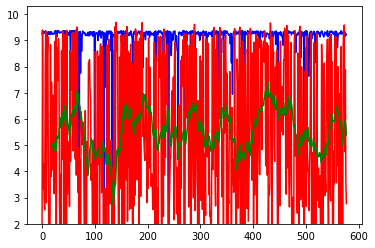

In [118]:
plt.ylim(2,10.3)
plt.plot(Entropy_H0FIX, 'b-')
plt.plot(Entropy_H1FIX, 'r-')
plt.plot(Entropy_H1_seriesFIX.rolling(20).mean(), 'g-')

In [119]:
def read_files_bundle(path, label, limit):
    data = []
    os.chdir(path)
    i = 0
    for file in os.listdir():
        data_df = pd.read_csv(file)
        # fill NaN with an interpolated value
        data_df = data_df.interpolate()
        period = int(len(data_df)/limit)
        periodicSampler = Resampler(period=period)
        #print(i,file)
        # resample the files to that all of them are the same length (in entries)
        # NOTE: timestamps are omitted and timesteps are going to be different for each resampled time series!
        index_sampled, signal_sampled = periodicSampler.fit_transform_resample(data_df.index, data_df[label])
        data.append(signal_sampled)
        i += 1
    data_T = list(map(list, zip(*data)))
    data = np.array(data_T)
    #df = pd.DataFrame.from_records(data_T)
    return data.T

In [120]:
X_data = read_files_bundle("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/0/", "P-TPT",2000)
X_data.shape

(597, 2039)

In [122]:
TE = TakensEmbedding(time_delay=70, dimension=11, stride=2)
X_norm1000 = TE.fit_transform(X_data)
X_norm1000.shape

(597, 670, 11)

In [123]:
homology_dimensions = (0, 1)
VRP = VietorisRipsPersistence(homology_dimensions=homology_dimensions)
X_diagrams_norm1000 = VRP.fit_transform(X_norm1000)

In [124]:
Betti = BettiCurve()
Betti_norm1000 = Betti.fit_transform(X_diagrams_norm1000)
Betti_norm1000.shape

(597, 2, 100)

In [125]:
import plotly.express as px
figBetti = px.line()

for i in range(len(Betti_norm1000[:,0,0])):
#for i in range(50):
    figBetti.add_scatter(y=(Betti_norm1000[i, 0, :]+5*i))
figBetti.show()

In [126]:
import plotly.express as px
figBetti = px.line()

for i in range(len(Betti_norm1000[:,1,0])):
#for i in range(50):
    figBetti.add_scatter(y=(Betti_norm1000[i, 1, :]+5*i))
figBetti.show()

In [127]:
import statistics as stats
meanBettiH0 = []
medianBettiH0 = []
modeBettiH0 = []

Betti_norm1000[i, 0, :]
for i in range(len(Betti_norm1000[:,0,0])):
    meanBettiH0.append(stats.mean(Betti_norm1000[i,0,:]))
    medianBettiH0.append(stats.median(Betti_norm1000[i,0,:]))
    modeBettiH0.append(stats.mode(Betti_norm1000[i,0,:]))
    
    
figBetti = px.line()
figBetti.add_scatter(y=(meanBettiH0), name="Mean of Betti curve H_0")
figBetti.add_scatter(y=(medianBettiH0), name="Median of Betti curve H_0")
#figBetti.add_scatter(y=(modeBettiH0),name="Mode of Betti curve H_0")
figBetti.show()

In [338]:
maxBettiH1 =[]

for i in range(len(Betti_norm1000[:,1,0])):
    maxBettiH1.append(np.amax(Betti_norm1000[i,1,:]))
        
figBetti = px.line()
figBetti.add_scatter(y=(maxBettiH1),name="Max of Betti curve H_1")

figBetti.show()

In [348]:
pers_H0 = []
pers_H1 = []
max_pers_H0 = []
max_pers_H1 = []

for PersDiag in X_diagrams_norm1000: 
    for point in PersDiag:
        birth = point[0]
        death = point[1]
        dimension = point[2]
        persistence = abs(death - birth)
        pers_H0.extend([persistence] if dimension == 0 else [])
        pers_H1.extend([persistence] if dimension == 1 else [])
    max_pers_H0.append(np.amax(pers_H0))
    max_pers_H1.append(np.amax(pers_H1))
    pers_H0 = []
    pers_H1 = []
           
fig = px.line(title='Maximum Persistence for BHP, slugging dataset')
fig.add_scatter(y=max_pers_H0, name="Max Pers in homology dimension H_0")
fig.add_scatter(y=max_pers_H1, name="Max Pers in homology dimension H_1")
fig.show() 

the variance is so different that i have tried to separate them by well, but it did not matter.

## Analysis of Slugging P - TPT

In [131]:
slug_data_single_df = pd.read_csv("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/3/ALL/WELL-00001_20170320130025.csv")
signal = slug_data_single_df["P-TPT"]

In [132]:
optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
    signal, max_time_delay, max_embedding_dimension, stride=stride
    )

print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")

embedding_dimension = optimal_embedding_dimension
embedding_time_delay = optimal_time_delay
stride = 1

embedder = SingleTakensEmbedding(
    parameters_type="fixed", n_jobs=optimal_embedding_dimension, time_delay=optimal_time_delay, dimension=6, stride=stride
)

signal_embedded = embedder.fit_transform(signal)

pca = PCA(n_components=3)
signal_embedded_pca = pca.fit_transform(signal_embedded)

plot_point_cloud(signal_embedded_pca)

Optimal embedding time delay based on mutual information: 90
Optimal embedding dimension based on false nearest neighbors: 14


In [224]:
find_shortest_file("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/3/ALL/", "P-TPT")

12999

In [228]:
slugging_signals, slugging_df = read_files("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/3/REAL/", "P-TPT",3000)

0 WELL-00014_20170921200114.csv
1 WELL-00014_20170925160218.csv
2 WELL-00014_20170926170228.csv
3 WELL-00014_20170920010042.csv
4 WELL-00014_20170920060228.csv
5 WELL-00014_20170921050404.csv
6 WELL-00014_20170921100155.csv
7 WELL-00001_20170320130025.csv
8 WELL-00014_20170920110053.csv
9 WELL-00014_20170922060124.csv
10 WELL-00014_20170926020340.csv
11 WELL-00014_20171028130000.csv
12 WELL-00014_20170925210042.csv
13 WELL-00014_20171028080000.csv
14 WELL-00014_20170921000053.csv
15 WELL-00014_20170919210016.csv
16 WELL-00014_20170925060042.csv
17 WELL-00014_20171028180038.csv
18 WELL-00014_20170920190207.csv
19 WELL-00014_20170925010031.csv
20 WELL-00014_20170918020114.csv
21 WELL-00014_20170917200000.csv
22 WELL-00014_20170926070042.csv
23 WELL-00014_20170922010042.csv
24 WELL-00014_20170922110042.csv
25 WELL-00014_20170918120103.csv
26 WELL-00014_20170921150042.csv
27 WELL-00014_20170926120103.csv
28 WELL-00014_20170918070135.csv
29 WELL-00014_20170922160249.csv
30 WELL-00014_201709

In [229]:
slugging_df

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,15923800.0,16364360.0,14545720.0,15763660.0,14563290.0,16229530.0,15593270.0,14071870.0,15840130.0,14177770.0,...,13829370.0,15829460.0,16268030.0,14860340.0,14000140.0,15411580.0,14999240.0,15915160.0,14880540.0,13445530.0
1,15918610.0,16363720.0,14548790.0,15765810.0,14576340.0,16229990.0,15595580.0,14073420.0,15828820.0,14182160.0,...,13835010.0,15831490.0,16265920.0,14865070.0,14002940.0,15416880.0,15002700.0,15916140.0,14883960.0,13444940.0
2,15912720.0,16362380.0,14551830.0,15765690.0,14590570.0,16229360.0,15599700.0,14074970.0,15817510.0,14185840.0,...,13841950.0,15835000.0,16263820.0,14871360.0,14008580.0,15420080.0,15006930.0,15917620.0,14894200.0,13444910.0
3,15907210.0,16362290.0,14555280.0,15767940.0,14601440.0,16229920.0,15603820.0,14076510.0,15807980.0,14189210.0,...,13848500.0,15837910.0,16262160.0,14876400.0,14010840.0,15423520.0,15010630.0,15921260.0,14901340.0,13445490.0
4,15897370.0,16363950.0,14559050.0,15772310.0,14607750.0,16230600.0,15606990.0,14078060.0,15790800.0,14194490.0,...,13854790.0,15840540.0,16260860.0,14880480.0,14015900.0,15426060.0,15013240.0,15924210.0,14907540.0,13445100.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3514,15601080.0,16158280.0,13981860.0,13736930.0,16264270.0,15348450.0,13590550.0,14229030.0,12149200.0,16302390.0,...,15017960.0,13505350.0,15501240.0,15517070.0,16151040.0,14030170.0,14368110.0,14270350.0,16648820.0,13891160.0
3515,15605130.0,16157700.0,13979980.0,13742360.0,16263460.0,15354840.0,13596640.0,14227370.0,12161210.0,16301330.0,...,15021780.0,13514340.0,15507060.0,15522500.0,16146620.0,14036000.0,14376500.0,14271750.0,16646380.0,13891950.0
3516,15608310.0,16156370.0,13979130.0,13746210.0,16263780.0,15356840.0,13603510.0,14225710.0,12166690.0,16301920.0,...,15032080.0,13526300.0,15511520.0,15525430.0,16144820.0,14040760.0,14382870.0,14273620.0,16643070.0,13893790.0
3517,15613390.0,16155690.0,13976880.0,13750370.0,16260680.0,15361840.0,13610120.0,14224050.0,12173620.0,16301910.0,...,15040110.0,13535350.0,15517210.0,15530240.0,16144140.0,14045990.0,14390450.0,14275360.0,16639880.0,13895500.0


Convert everything to Bar to get better resolution in the filtration (otherwise the Betti curves are unreadable)

In [230]:
PatoBar = 1/100000

slugging_df = slugging_df.apply(lambda x: x*PatoBar)
slugging_df 

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
0,159.2380,163.6436,145.4572,157.6366,145.6329,162.2953,155.9327,140.7187,158.4013,141.7777,...,138.2937,158.2946,162.6803,148.6034,140.0014,154.1158,149.9924,159.1516,148.8054,134.4553
1,159.1861,163.6372,145.4879,157.6581,145.7634,162.2999,155.9558,140.7342,158.2882,141.8216,...,138.3501,158.3149,162.6592,148.6507,140.0294,154.1688,150.0270,159.1614,148.8396,134.4494
2,159.1272,163.6238,145.5183,157.6569,145.9057,162.2936,155.9970,140.7497,158.1751,141.8584,...,138.4195,158.3500,162.6382,148.7136,140.0858,154.2008,150.0693,159.1762,148.9420,134.4491
3,159.0721,163.6229,145.5528,157.6794,146.0144,162.2992,156.0382,140.7651,158.0798,141.8921,...,138.4850,158.3791,162.6216,148.7640,140.1084,154.2352,150.1063,159.2126,149.0134,134.4549
4,158.9737,163.6395,145.5905,157.7231,146.0775,162.3060,156.0699,140.7806,157.9080,141.9449,...,138.5479,158.4054,162.6086,148.8048,140.1590,154.2606,150.1324,159.2421,149.0754,134.4510
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3514,156.0108,161.5828,139.8186,137.3693,162.6427,153.4845,135.9055,142.2903,121.4920,163.0239,...,150.1796,135.0535,155.0124,155.1707,161.5104,140.3017,143.6811,142.7035,166.4882,138.9116
3515,156.0513,161.5770,139.7998,137.4236,162.6346,153.5484,135.9664,142.2737,121.6121,163.0133,...,150.2178,135.1434,155.0706,155.2250,161.4662,140.3600,143.7650,142.7175,166.4638,138.9195
3516,156.0831,161.5637,139.7913,137.4621,162.6378,153.5684,136.0351,142.2571,121.6669,163.0192,...,150.3208,135.2630,155.1152,155.2543,161.4482,140.4076,143.8287,142.7362,166.4307,138.9379
3517,156.1339,161.5569,139.7688,137.5037,162.6068,153.6184,136.1012,142.2405,121.7362,163.0191,...,150.4011,135.3535,155.1721,155.3024,161.4414,140.4599,143.9045,142.7536,166.3988,138.9550


In [232]:
slug_point_clouds_pca, slug_diagrams, slug_entropies, slug_norm_entropies = batch_analyzer(slugging_df, 3, 12, 150)

analyzing nr. 1 progress: 3 % dim 7 delay 149
analyzing nr. 2 progress: 6 % dim 7 delay 139
analyzing nr. 3 progress: 9 % dim 7 delay 137
analyzing nr. 4 progress: 12 % dim 7 delay 142
analyzing nr. 5 progress: 15 % dim 7 delay 148
analyzing nr. 6 progress: 18 % dim 4 delay 150
analyzing nr. 7 progress: 21 % dim 7 delay 148
analyzing nr. 8 progress: 25 % dim 8 delay 117
analyzing nr. 9 progress: 28 % dim 4 delay 141
analyzing nr. 10 progress: 31 % dim 7 delay 150
analyzing nr. 11 progress: 34 % dim 6 delay 147
analyzing nr. 12 progress: 37 % dim 7 delay 150
analyzing nr. 13 progress: 40 % dim 7 delay 142
analyzing nr. 14 progress: 43 % dim 8 delay 127
analyzing nr. 15 progress: 46 % dim 7 delay 147
analyzing nr. 16 progress: 50 % dim 6 delay 149
analyzing nr. 17 progress: 53 % dim 7 delay 150
analyzing nr. 18 progress: 56 % dim 7 delay 148
analyzing nr. 19 progress: 59 % dim 7 delay 142
analyzing nr. 20 progress: 62 % dim 7 delay 148
analyzing nr. 21 progress: 65 % dim 5 delay 150
anal

In [233]:
tmp = slug_entropies
Entropy_H0 = []
Entropy_H1 = []

for item in tmp:
    Entropy_H0.append(item[0][0])
    Entropy_H1.append(item[0][1])

Entropy_H0_slug = pd.Series(Entropy_H0)
Entropy_H1_slug = pd.Series(Entropy_H1)

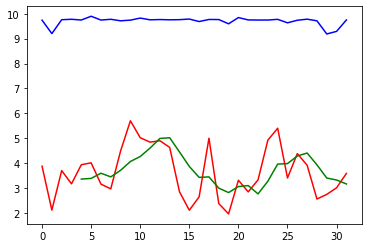

In [234]:
plt.plot(Entropy_H0_slug, 'b-')
plt.plot(Entropy_H1_slug, 'r-')
plt.plot(Entropy_H1_slug.rolling(5).mean(), 'g-')

In [235]:
tmp = slug_norm_entropies
Entropy_H0 = []
Entropy_H1 = []

for item in tmp:
    Entropy_H0.append(item[0][0])
    Entropy_H1.append(item[0][1])

Entropy_H0_slug = pd.Series(Entropy_H0)
Entropy_H1_slug = pd.Series(Entropy_H1)

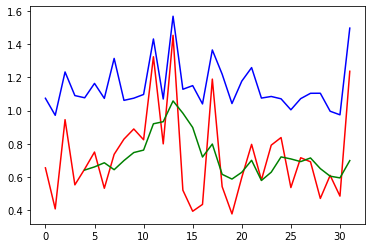

In [236]:
plt.plot(Entropy_H0_slug, 'b-')
plt.plot(Entropy_H1_slug, 'r-')
plt.plot(Entropy_H1_slug.rolling(5).mean(), 'g-')

In [237]:
find_shortest_file("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/3/SIMULATED/", "P-TPT")

12999

In [238]:
slugging_signals, slugging_SIM_df = read_files("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/3/SIMULATED/", "P-TPT",3000)
slugging_df = slugging_df.apply(lambda x: x*PatoBar)

0 SIMULATED_00035.csv
1 SIMULATED_00021.csv
2 SIMULATED_00009.csv
3 SIMULATED_00008.csv
4 SIMULATED_00020.csv
5 SIMULATED_00034.csv
6 SIMULATED_00022.csv
7 SIMULATED_00036.csv
8 SIMULATED_00037.csv
9 SIMULATED_00023.csv
10 SIMULATED_00027.csv
11 SIMULATED_00033.csv
12 SIMULATED_00032.csv
13 SIMULATED_00026.csv
14 SIMULATED_00018.csv
15 SIMULATED_00030.csv
16 SIMULATED_00024.csv
17 SIMULATED_00025.csv
18 SIMULATED_00031.csv
19 SIMULATED_00019.csv
20 SIMULATED_00056.csv
21 SIMULATED_00042.csv
22 SIMULATED_00043.csv
23 SIMULATED_00057.csv
24 SIMULATED_00041.csv
25 SIMULATED_00055.csv
26 SIMULATED_00069.csv
27 SIMULATED_00068.csv
28 SIMULATED_00054.csv
29 SIMULATED_00040.csv
30 SIMULATED_00044.csv
31 SIMULATED_00050.csv
32 SIMULATED_00051.csv
33 SIMULATED_00045.csv
34 SIMULATED_00053.csv
35 SIMULATED_00047.csv
36 SIMULATED_00046.csv
37 SIMULATED_00052.csv
38 SIMULATED_00063.csv
39 SIMULATED_00062.csv
40 SIMULATED_00060.csv
41 SIMULATED_00074.csv
42 SIMULATED_00048.csv
43 SIMULATED_00049.cs

In [239]:
slugSIM_point_clouds_pca, slugSIM_diagrams, slugSIM_entropies, slugSIM_norm_entropies = batch_analyzer(slugging_SIM_df, 2, 20, 90)

analyzing nr. 1 progress: 1 % dim 12 delay 89
analyzing nr. 2 progress: 2 % dim 13 delay 76
analyzing nr. 3 progress: 4 % dim 12 delay 89
analyzing nr. 4 progress: 5 % dim 11 delay 90
analyzing nr. 5 progress: 6 % dim 12 delay 89
analyzing nr. 6 progress: 8 % dim 11 delay 90
analyzing nr. 7 progress: 9 % dim 12 delay 88
analyzing nr. 8 progress: 10 % dim 12 delay 90
analyzing nr. 9 progress: 12 % dim 12 delay 88
analyzing nr. 10 progress: 13 % dim 9 delay 89
analyzing nr. 11 progress: 14 % dim 12 delay 87
analyzing nr. 12 progress: 16 % dim 13 delay 82
analyzing nr. 13 progress: 17 % dim 8 delay 63
analyzing nr. 14 progress: 18 % dim 12 delay 90
analyzing nr. 15 progress: 20 % dim 12 delay 90
analyzing nr. 16 progress: 21 % dim 11 delay 90
analyzing nr. 17 progress: 22 % dim 9 delay 90
analyzing nr. 18 progress: 24 % dim 12 delay 79
analyzing nr. 19 progress: 25 % dim 13 delay 85
analyzing nr. 20 progress: 27 % dim 10 delay 90
analyzing nr. 21 progress: 28 % dim 14 delay 74
analyzing n

In [240]:
tmp = slugSIM_entropies
Entropy_H0 = []
Entropy_H1 = []

for item in tmp:
    Entropy_H0.append(item[0][0])
    Entropy_H1.append(item[0][1])

Entropy_H0_slug = pd.Series(Entropy_H0)
Entropy_H1_slug = pd.Series(Entropy_H1)

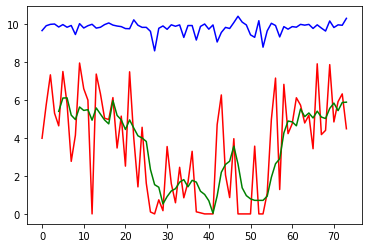

In [241]:
plt.plot(Entropy_H0_slug, 'b-')
plt.plot(Entropy_H1_slug, 'r-')
plt.plot(Entropy_H1_slug.rolling(5).mean(), 'g-')

In [242]:
tmp = slugSIM_norm_entropies
Entropy_H0 = []
Entropy_H1 = []

for item in tmp:
    Entropy_H0.append(item[0][0])
    Entropy_H1.append(item[0][1])

Entropy_H0_slug = pd.Series(Entropy_H0)
Entropy_H1_slug = pd.Series(Entropy_H1)

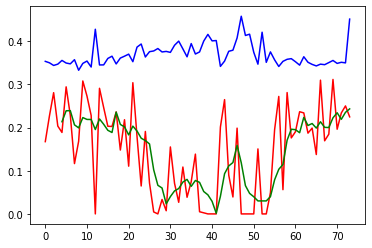

In [243]:
plt.plot(Entropy_H0_slug, 'b-')
plt.plot(Entropy_H1_slug, 'r-')
plt.plot(Entropy_H1_slug.rolling(5).mean(), 'g-')

In [244]:
slugging_signals, slugging_df = read_files("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/3/ALL/", "P-TPT",3000)
slugging_df = slugging_df.apply(lambda x: x*PatoBar)

0 SIMULATED_00035.csv
1 SIMULATED_00021.csv
2 SIMULATED_00009.csv
3 WELL-00014_20170921200114.csv
4 WELL-00014_20170925160218.csv
5 WELL-00014_20170926170228.csv
6 SIMULATED_00008.csv
7 SIMULATED_00020.csv
8 SIMULATED_00034.csv
9 SIMULATED_00022.csv
10 WELL-00014_20170920010042.csv
11 SIMULATED_00036.csv
12 WELL-00014_20170920060228.csv
13 WELL-00014_20170921050404.csv
14 SIMULATED_00037.csv
15 SIMULATED_00023.csv
16 WELL-00014_20170921100155.csv
17 SIMULATED_00027.csv
18 WELL-00001_20170320130025.csv
19 WELL-00014_20170920110053.csv
20 SIMULATED_00033.csv
21 WELL-00014_20170922060124.csv
22 SIMULATED_00032.csv
23 SIMULATED_00026.csv
24 SIMULATED_00018.csv
25 SIMULATED_00030.csv
26 SIMULATED_00024.csv
27 WELL-00014_20170926020340.csv
28 WELL-00014_20171028130000.csv
29 SIMULATED_00025.csv
30 SIMULATED_00031.csv
31 SIMULATED_00019.csv
32 SIMULATED_00056.csv
33 SIMULATED_00042.csv
34 WELL-00014_20170925210042.csv
35 WELL-00014_20171028080000.csv
36 SIMULATED_00043.csv
37 SIMULATED_00057.

In [245]:
slug_point_clouds_pca, slug_diagrams, slug_entropies, slug_norm_entropies = batch_analyzer(slugging_df, 2, 12, 150)

analyzing nr. 1 progress: 0 % dim 10 delay 111
analyzing nr. 2 progress: 1 % dim 8 delay 150
analyzing nr. 3 progress: 2 % dim 7 delay 149
analyzing nr. 4 progress: 3 % dim 7 delay 149
analyzing nr. 5 progress: 4 % dim 8 delay 139
analyzing nr. 6 progress: 5 % dim 7 delay 147
analyzing nr. 7 progress: 6 % dim 8 delay 127
analyzing nr. 8 progress: 7 % dim 8 delay 142
analyzing nr. 9 progress: 8 % dim 8 delay 136
analyzing nr. 10 progress: 9 % dim 8 delay 150
analyzing nr. 11 progress: 10 % dim 7 delay 145
analyzing nr. 12 progress: 11 % dim 8 delay 150
analyzing nr. 13 progress: 12 % dim 7 delay 146
analyzing nr. 14 progress: 13 % dim 8 delay 150
analyzing nr. 15 progress: 14 % dim 8 delay 149
analyzing nr. 16 progress: 15 % dim 8 delay 140
analyzing nr. 17 progress: 16 % dim 7 delay 138
analyzing nr. 18 progress: 16 % dim 12 delay 87
analyzing nr. 19 progress: 17 % dim 8 delay 140
analyzing nr. 20 progress: 18 % dim 8 delay 141
analyzing nr. 21 progress: 19 % dim 10 delay 112
analyzing

In [295]:
slug_data = read_files_bundle("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/3/ALL/", "P-TPT",3000)
slug_data = slug_data * PatoBar

VRP_onlyH0 = VietorisRipsPersistence(homology_dimensions =(0,))
VRP_onlyH1 = VietorisRipsPersistence(homology_dimensions =(1,))

TE = TakensEmbedding(time_delay=145, dimension=8, stride=2)
slug_data_norm = TE.fit_transform(slug_data)
slug_data_diagrams_norm = VRP.fit_transform(slug_data_norm)
slug_data_diagrams_H0 = VRP_onlyH0.fit_transform(slug_data_norm)
slug_data_diagrams_H1 = VRP_onlyH1.fit_transform(slug_data_norm)
slug_data_Betti_H0 = Betti.fit_transform(slug_data_diagrams_H0)
slug_data_Betti_H1 = Betti.fit_transform(slug_data_diagrams_H1)

Let's see the results for a simulated slugging event, sample nr.60

In [296]:
TE.fit_transform_plot(slug_data, sample=60)

array([[[92.24574, 99.02855, 91.01058, ..., 94.38902, 84.83733,
         97.93617],
        [93.72865, 98.84169, 89.2601 , ..., 93.21072, 86.24782,
         98.48981],
        [95.06738, 98.53024, 87.00533, ..., 91.63011, 87.83656,
         98.86081],
        ...,
        [98.83236, 94.87591, 84.25333, ..., 83.36549, 95.18877,
         98.50093],
        [99.04101, 93.80179, 85.5164 , ..., 83.26283, 96.36263,
         98.02386],
        [99.08989, 92.41351, 87.03487, ..., 83.88073, 97.31574,
         97.37884]]])

In [297]:
VRP.fit_transform_plot(slug_data_norm, sample=60)

array([[[0.00000000e+00, 1.32532865e-02, 0.00000000e+00],
        [0.00000000e+00, 1.68437790e-02, 0.00000000e+00],
        [0.00000000e+00, 1.71280764e-02, 0.00000000e+00],
        ...,
        [0.00000000e+00, 2.45741874e-01, 0.00000000e+00],
        [0.00000000e+00, 2.46027678e-01, 0.00000000e+00],
        [2.51665086e-01, 2.35376129e+01, 1.00000000e+00]]])

In [298]:
sample60_H0 = VRP_onlyH0.fit_transform_plot(slug_data_norm, sample=60)

In [316]:
slug_data_diagrams_H0[60]

array([[0.        , 0.01325329, 0.        ],
       [0.        , 0.01684378, 0.        ],
       [0.        , 0.01712808, 0.        ],
       ...,
       [0.        , 0.24568807, 0.        ],
       [0.        , 0.24574187, 0.        ],
       [0.        , 0.24602768, 0.        ]])

In [328]:
slug_data_Betti_H1[60]

array([[0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])

In [337]:
VRP_onlyH0.fit_transform_plot(slug_data_norm, sample=4)

array([[[ 0.        ,  0.19112226,  0.        ],
        [ 0.        ,  0.21258111,  0.        ],
        [ 0.        ,  0.22174799,  0.        ],
        ...,
        [ 0.        , 17.25113106,  0.        ],
        [ 0.        , 18.42709541,  0.        ],
        [ 0.        , 19.88757133,  0.        ]]])

In [326]:
Betti.fit_transform_plot(slug_data_diagrams_H0, sample=60)

array([[[1014,   88,    0,    0,    0,    0,    0,    0,    0,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
            0,    0,    0,    0,    0,    0,    0,    0,    0,    0]]])

In [303]:
slug_data_single_df = pd.read_csv("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/3/ALL/SIMULATED_00062.csv")
signal = slug_data_single_df["P-TPT"]
signal = signal / 100000

max_time_delay = 180
max_embedding_dimension = 12
stride = 1

ratio = len(signal)/1500
signal = signal[::int(ratio)]

optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
    signal, max_time_delay, max_embedding_dimension, stride=stride
    )
print(f"signal lenght: {len(signal)}")
print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")

embedding_dimension = optimal_embedding_dimension
embedding_time_delay = optimal_time_delay


embedder = SingleTakensEmbedding(
    parameters_type="fixed", n_jobs=-1, time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)

signal_embedded = embedder.fit_transform(signal)

pca = PCA(n_components=3)
signal_embedded_pca = pca.fit_transform(signal_embedded)
diagram = VRP.fit_transform_plot(signal_embedded_pca[None,:,:])
Betti.fit_transform_plot(diagram)



signal lenght: 1513
Optimal embedding time delay based on mutual information: 82
Optimal embedding dimension based on false nearest neighbors: 10


array([[[774, 774, 774, 774, 774, 774, 774, 774, 774, 774, 774, 774,
         774, 773, 767, 761, 748, 742, 734, 719, 708, 695, 685, 677,
         660, 647, 633, 621, 607, 597, 574, 559, 552, 538, 526, 513,
         502, 492, 483, 473, 455, 438, 428, 417, 412, 398, 385, 377,
         370, 354, 340, 326, 315, 302, 288, 274, 261, 253, 239, 227,
         216, 208, 191, 183, 175, 162, 147, 139, 134, 124, 116, 109,
         104,  96,  92,  90,  88,  84,  81,  77,  70,  68,  64,  58,
          56,  55,  52,  50,  48,  40,  35,  31,  26,  23,  19,  12,
          10,   7,   2,   0],
        [  1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,
           1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,
           1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,
           1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,
           1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,
           1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,
    

Let's see sample nr.64 (non simulated)

In [334]:
TE.fit_transform_plot(slug_data, sample=4)

array([[[163.6436, 158.66  , 137.5177, ..., 158.1651, 163.5737,
         159.1512],
        [163.6238, 158.5318, 137.4326, ..., 158.2577, 163.6978,
         158.9119],
        [163.6395, 158.336 , 137.3838, ..., 158.3854, 163.8127,
         158.5804],
        ...,
        [136.5257, 142.7383, 148.8093, ..., 153.5653, 135.9049,
         143.0031],
        [136.5236, 142.8635, 148.8948, ..., 153.2994, 135.952 ,
         143.125 ],
        [136.5214, 143.0203, 149.    , ..., 152.961 , 136.0115,
         143.2905]]])

In [335]:
VRP.fit_transform_plot(slug_data_norm, sample=4)

array([[[ 0.        ,  0.19112226,  0.        ],
        [ 0.        ,  0.21258111,  0.        ],
        [ 0.        ,  0.22174799,  0.        ],
        ...,
        [15.61036682, 34.86309814,  1.        ],
        [12.68916321, 12.72562122,  1.        ],
        [12.65943336, 12.69952297,  1.        ]]])

In [333]:
figBettiSlug0 = px.line()

#for i in range(len(slug_data_Betti_H0[:,0,0])):
for i in range(20):
    figBettiSlug0.add_scatter(y=(slug_data_Betti_H0[i, 0, :]+50*i))
figBettiSlug0.show()

In [306]:
figBettiSlug1 = px.line()

for i in range(len(slug_data_Betti_H1[:,0,0])):
    figBettiSlug1.add_scatter(y=(slug_data_Betti_H1[i, 0, :]+5*i))
figBettiSlug1.show()

In [308]:
meanBettiH0 = []
medianBettiH0 = []
modeBettiH0 = []
maxBettiH0 = []
meanBettiH1 = []
medianBettiH1 = []
modeBettiH1 = []
maxBettiH1 = []

for i in range(len(slug_data_Betti_H0[:,0,0])):
    meanBettiH0.append(stats.mean(slug_data_Betti_H0[i,0,:]))
    medianBettiH0.append(stats.median(slug_data_Betti_H0[i,0,:]))
    modeBettiH0.append(stats.mode(slug_data_Betti_H0[i,0,:]))
    maxBettiH0.append(np.amax(slug_data_Betti_H0[i,0,:]))
    
for i in range(len(slug_data_Betti_H1[:,0,0])):
    meanBettiH1.append(stats.mean(slug_data_Betti_H1[i,0,:]))
    medianBettiH1.append(stats.median(slug_data_Betti_H1[i,0,:]))
    modeBettiH1.append(stats.mode(slug_data_Betti_H1[i,0,:]))
    maxBettiH1.append(np.amax(slug_data_Betti_H1[i,0,:]))
    
    
figBettiH0 = px.line()
figBettiH0.add_scatter(y=(meanBettiH0), name="Mean of Betti curve H_0")
figBettiH0.add_scatter(y=(medianBettiH0), name="Median of Betti curve H_0")
figBettiH0.add_scatter(y=(modeBettiH0),name="Mode of Betti curve H_0")
#figBetti.add_scatter(y=(maxBettiH0),name="Max of Betti curve H_0")
figBettiH0.show()

In [309]:
figBettiH1 = px.line()
figBettiH1.add_scatter(y=(meanBettiH1), name="Mean of Betti curve H_1")
figBettiH1.add_scatter(y=(medianBettiH1), name="Median of Betti curve H_1")
figBettiH1.add_scatter(y=(modeBettiH1),name="Mode of Betti curve H_1")
#figBetti.add_scatter(y=(maxBettiH1),name="Max of Betti curve H_1")

figBettiH1.show()

In [341]:
slug_data_Betti_H0[2]

array([[1014, 1014, 1014, 1014,  992,  950,  905,  868,  832,  803,  767,
         730,  705,  677,  651,  625,  598,  569,  531,  492,  458,  426,
         395,  355,  312,  273,  243,  209,  178,  149,  121,   98,   81,
          67,   54,   42,   28,   23,   18,   13,   10,    9,    9,    6,
           3,    2,    1,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0]])

In [342]:
maxBettiH0 =[]
maxBettiH1 =[]

for i in range(len(slug_data_Betti_H0[:,0,0])):
    maxBettiH0.append(np.amax(slug_data_Betti_H0[i,0,:]))
for i in range(len(slug_data_Betti_H1[:,0,0])):
    maxBettiH1.append(np.amax(slug_data_Betti_H1[i,0,:]))
        
figBetti = px.line()
#figBetti.add_scatter(y=(maxBettiH0),name="Max of Betti curve H_0")
figBetti.add_scatter(y=(maxBettiH1),name="Max of Betti curve H_1")

figBetti.show()

In [330]:
pers_H0 = []
pers_H1 = []
max_pers_H0 = []
max_pers_H1 = []

for PersDiag in slug_data_diagrams_norm: 
    for point in PersDiag:
        birth = point[0]
        death = point[1]
        dimension = point[2]
        persistence = abs(death - birth)
        pers_H0.extend([persistence] if dimension == 0 else [])
        pers_H1.extend([persistence] if dimension == 1 else [])
    max_pers_H0.append(np.amax(pers_H0))
    max_pers_H1.append(np.amax(pers_H1))
    pers_H0 = []
    pers_H1 = []
           
fig = px.line(title='Maximum Persistence for BHP, slugging dataset')
fig.add_scatter(y=max_pers_H0, name="Max Pers in homology dimension H_0")
fig.add_scatter(y=max_pers_H1, name="Max Pers in homology dimension H_1")
fig.show() 

In [223]:
slug_data_df = pd.read_csv("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/3/SIMULATED_00005.csv")

In [224]:
slug_data_df

,timestamp,P-PDG,P-TPT,T-TPT,P-MON-CKP,T-JUS-CKP,P-JUS-CKGL,T-JUS-CKGL,QGL,class
0,2018-04-08 03:23:38.000000,26201590.0,16807680.0,118.3466,4047800.0,83.66679,NaN,NaN,NaN,3
1,2018-04-08 03:23:39.000000,26201410.0,16807450.0,118.3465,4047815.0,83.66234,NaN,NaN,NaN,3
2,2018-04-08 03:23:40.000000,26201220.0,16807220.0,118.3464,4047830.0,83.65790,NaN,NaN,NaN,3
3,2018-04-08 03:23:41.000000,26201030.0,16806980.0,118.3462,4047843.0,83.65346,NaN,NaN,NaN,3
4,2018-04-08 03:23:42.000000,26200840.0,16806750.0,118.3461,4047856.0,83.64903,NaN,NaN,NaN,3
...,...,...,...,...,...,...,...,...,...,...
61994,2018-04-08 20:36:52.000000,26910280.0,17541780.0,112.9325,4051613.0,49.87471,NaN,NaN,NaN,3
61995,2018-04-08 20:36:53.000000,26910300.0,17541870.0,112.9322,4051594.0,49.87138,NaN,NaN,NaN,3
61996,2018-04-08 20:36:54.000000,26910310.0,17541950.0,112.9320,4051575.0,49.86807,NaN,NaN,NaN,3
61997,2018-04-08 20:36:55.000000,26910330.0,17542030.0,112.9317,4051555.0,49.86476,NaN,NaN,NaN,3


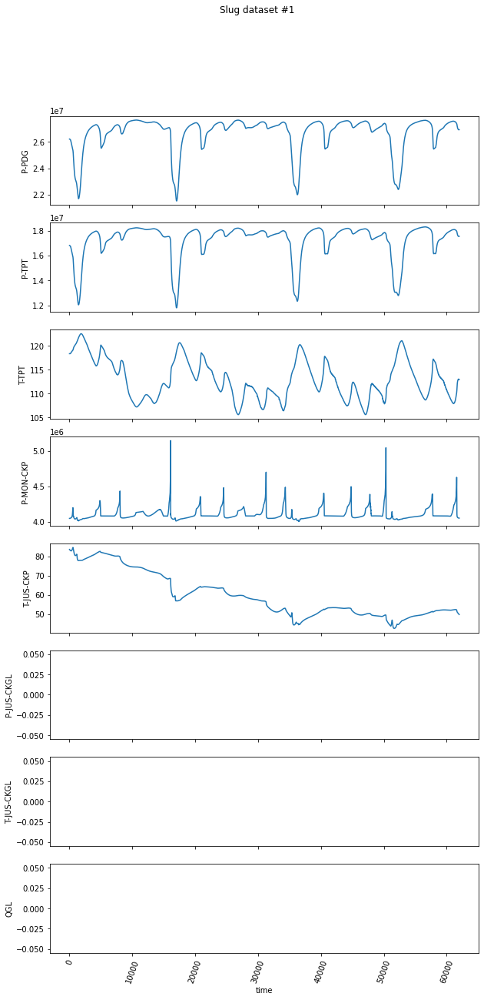

In [225]:
fig, ts = plt.subplots(8,figsize=(10,20),sharex = True)

fig.suptitle('Slug dataset #1')
ts[7].set_xlabel('time')
ts[0].set_ylabel("P-PDG")
ts[1].set_ylabel('P-TPT')
ts[2].set_ylabel('T-TPT')
ts[3].set_ylabel("P-MON-CKP")
ts[4].set_ylabel('T-JUS-CKP')
ts[5].set_ylabel('P-JUS-CKGL')
ts[6].set_ylabel("T-JUS-CKGL")
ts[7].set_ylabel('QGL')

degrees = 70
plt.xticks(rotation=degrees)

ts[0].plot(slug_data_df.index, slug_data_df["P-PDG"])
ts[1].plot(slug_data_df.index, slug_data_df["P-TPT"])
ts[2].plot(slug_data_df.index, slug_data_df["T-TPT"])
ts[3].plot(slug_data_df.index, slug_data_df["P-MON-CKP"])
ts[4].plot(slug_data_df.index, slug_data_df["T-JUS-CKP"])
ts[5].plot(slug_data_df.index, slug_data_df["P-JUS-CKGL"])
ts[6].plot(slug_data_df.index, slug_data_df["T-JUS-CKGL"])
ts[7].plot(slug_data_df.index, slug_data_df["QGL"])


In [226]:
slug_data_df['P-TPT'].isnull().values.any()

False

In [227]:
slug_data_df= slug_data_df.interpolate()

In [233]:
period = 50
periodicSampler = Resampler(period=period)
slug_data_df = slug_data_df.interpolate(method='linear')
signal = slug_data_df["P-TPT"]

#slug_data_df.index, slug_data_df["P-TPT"]
index_sampled, signal_sampled = periodicSampler.fit_transform_resample(slug_data_df.index, signal)

#print(index_sampled, signal_sampled, len(signal_sampled))

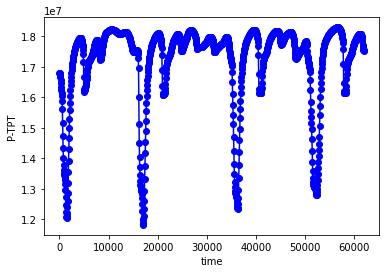

In [234]:
signal_downsampled = pd.DataFrame(signal_sampled,
                  index=index_sampled, columns=['P-TPT'])
#signal_downsampled['P-TPT']
plt.xlabel('time');
plt.ylabel('P-TPT');
plt.plot(signal_downsampled.index,signal_downsampled['P-TPT'], 'bo-')

In [236]:
print('length of signal to analyze', len(signal_downsampled))

max_time_delay = 150 
max_embedding_dimension = 15
stride = 1

optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
    signal_downsampled, max_time_delay, max_embedding_dimension, stride=stride
    )

print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")

embedding_dimension = optimal_embedding_dimension
embedding_time_delay = optimal_time_delay

embedder = SingleTakensEmbedding(
    parameters_type="fixed", n_jobs=6, time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)

signal_embedded = embedder.fit_transform(signal_downsampled)

pca = PCA(n_components=3)
signal_embedded_pca = pca.fit_transform(signal_embedded)

plot_point_cloud(signal_embedded_pca)

length of signal to analyze 1240
Optimal embedding time delay based on mutual information: 58
Optimal embedding dimension based on false nearest neighbors: 11


In [237]:
homology_dimensions = (0, 1)
VRP = VietorisRipsPersistence(homology_dimensions=homology_dimensions)

signal_embedded_reshaped = signal_embedded.reshape(1, *signal_embedded.shape)
print(f"y_wn_embedded_reshaped.shape",signal_embedded_reshaped.shape)
print(f"y_wn_embedded.shape", signal_embedded.shape)

PerHom_signal = VRP.fit_transform(signal_embedded_reshaped)
VRP.plot(PerHom_signal)

y_wn_embedded_reshaped.shape (1, 660, 11)
y_wn_embedded.shape (660, 11)


In [238]:
PE_slug = PersistenceEntropy()
PE_slug_norm = PersistenceEntropy(normalize=True)
features = PE_slug.fit_transform(PerHom_signal)
features_norm = PE_slug_norm.fit_transform(PerHom_signal)

In [239]:
features

array([[9.14272792, 4.02067644]])

In [240]:
features_norm

array([[0.33100592, 0.1620816 ]])

In [265]:
slug_data_sim_df = pd.read_csv("/Users/simo/repos/RareEventsDataset/3w_dataset-master/data/data/8/WELL-00021_20170509013517.csv")

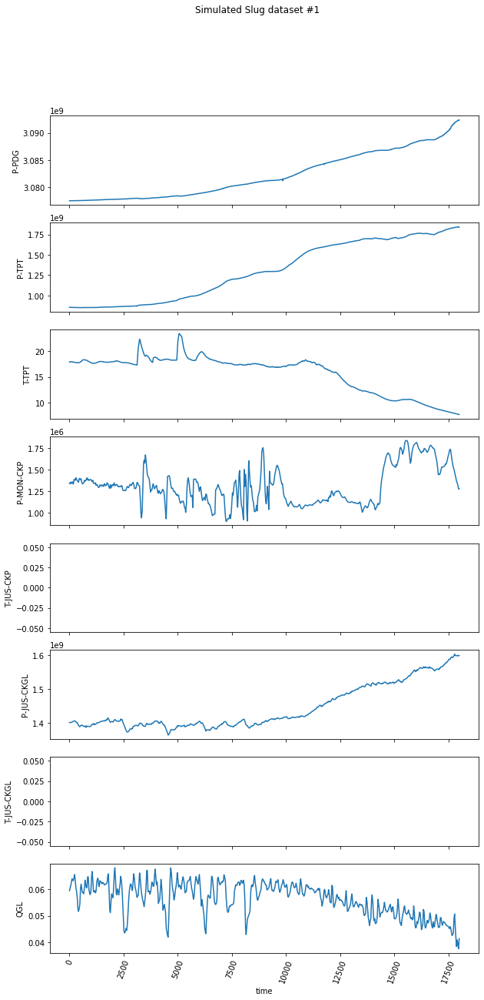

In [266]:
slug_data_sim_df = slug_data_sim_df.head(18000)

fig, ts = plt.subplots(8,figsize=(10,20),sharex = True)

fig.suptitle('Simulated Slug dataset #1')
ts[7].set_xlabel('time')
ts[0].set_ylabel("P-PDG")
ts[1].set_ylabel('P-TPT')
ts[2].set_ylabel('T-TPT')
ts[3].set_ylabel("P-MON-CKP")
ts[4].set_ylabel('T-JUS-CKP')
ts[5].set_ylabel('P-JUS-CKGL')
ts[6].set_ylabel("T-JUS-CKGL")
ts[7].set_ylabel('QGL')

degrees = 70
plt.xticks(rotation=degrees)

ts[0].plot(slug_data_sim_df.index, slug_data_sim_df["P-PDG"])
ts[1].plot(slug_data_sim_df.index, slug_data_sim_df["P-TPT"])
ts[2].plot(slug_data_sim_df.index, slug_data_sim_df["T-TPT"])
ts[3].plot(slug_data_sim_df.index, slug_data_sim_df["P-MON-CKP"])
ts[4].plot(slug_data_sim_df.index, slug_data_sim_df["T-JUS-CKP"])
ts[5].plot(slug_data_sim_df.index, slug_data_sim_df["P-JUS-CKGL"])
ts[6].plot(slug_data_sim_df.index, slug_data_sim_df["T-JUS-CKGL"])
ts[7].plot(slug_data_sim_df.index, slug_data_sim_df["QGL"])


In [253]:
period = 5
periodicSampler = Resampler(period=period)
signal = slug_data_sim_df["P-TPT"]

slug_data_sim_df.index, slug_data_sim_df["P-TPT"]
index_sampled, signal_sim_sampled = periodicSampler.fit_transform_resample(slug_data_sim_df.index, signal)


In [254]:
signal_sim_sampled

array([17747090., 17748130., 17749180., ..., 17782190., 17780100.,
       17776750.])

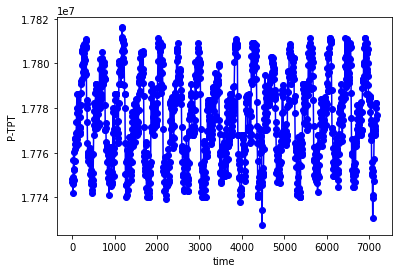

In [255]:
signal_sim_downsampled = pd.DataFrame(signal_sim_sampled,
                  index=index_sampled, columns=['P-TPT'])
plt.xlabel('time');
plt.ylabel('P-TPT');
plt.plot(signal_sim_downsampled.index,signal_sim_downsampled['P-TPT'], 'bo-')

In [256]:
print('length of signal to analyze', len(signal_sim_downsampled))

max_time_delay = 50 
max_embedding_dimension = 10
stride = 1

optimal_time_delay, optimal_embedding_dimension = takens_embedding_optimal_parameters(
    signal_sim_downsampled, max_time_delay, max_embedding_dimension, stride=stride
    )

print(f"Optimal embedding time delay based on mutual information: {optimal_time_delay}")
print(f"Optimal embedding dimension based on false nearest neighbors: {optimal_embedding_dimension}")

embedding_dimension = optimal_embedding_dimension
embedding_time_delay = optimal_time_delay

embedder = SingleTakensEmbedding(
    parameters_type="search", n_jobs=6, time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)

signal_sim_embedded = embedder.fit_transform(signal_sim_downsampled)

pca = PCA(n_components=3)
signal_sim_embedded_pca = pca.fit_transform(signal_sim_embedded)

plot_point_cloud(signal_sim_embedded_pca)

length of signal to analyze 1436
Optimal embedding time delay based on mutual information: 16
Optimal embedding dimension based on false nearest neighbors: 9


In [257]:
signal_sim_embedded_reshaped = signal_sim_embedded.reshape(1, *signal_sim_embedded.shape)
print(f"y_wn_embedded_reshaped.shape",signal_sim_embedded_reshaped.shape)
print(f"y_wn_embedded.shape", signal_sim_embedded_reshaped.shape)

PerHom_sim_signal = VRP.fit_transform(signal_sim_embedded_reshaped)
features_sim = PE_slug.fit_transform(PerHom_signal)
features_sim_norm = PE_slug_norm.fit_transform(PerHom_signal)

y_wn_embedded_reshaped.shape (1, 1308, 9)
y_wn_embedded.shape (1, 1308, 9)


In [258]:
features_sim

array([[9.14272792, 4.02067644]])

In [259]:
features_sim_norm

array([[0.33100592, 0.1620816 ]])

In [260]:
VRP.plot(PerHom_sim_signal)

In [82]:
PerHom_sim_signal.shape

(1, 919, 3)

In [89]:
PerHom_signal.shape

#tmp = np.vstack([PerHom_signal,PerHom_sim_signal])
#tmp.shape

(1, 533, 3)

In [94]:
diagramScaler = Scaler()
PerHom_signal_scaled = diagramScaler.fit_transform(PerHom_signal)
diagramScaler.plot(PerHom_signal_scaled)

In [92]:
PerHom_signal_sim_scaled = diagramScaler.fit_transform(PerHom_sim_signal)
diagramScaler.plot(PerHom_signal_sim_scaled)

In [95]:
features_sim = PE_slug.fit_transform(PerHom_signal_scaled)
features_sim_norm = PE_slug_norm.fit_transform(PerHom_signal_scaled)
features_sim

array([[8.85156327, 2.40306284, 4.83440879]])

In [96]:
features_sim_norm

array([[  1.49319727,   1.05423515, -11.44457834]])

In [111]:
HK = HeatKernel(sigma=.15, n_bins=60, n_jobs=-1) 
HK_slug = HK.fit_transform_plot(PerHom_signal_scaled, homology_dimension_idx=1)

In [112]:
HK.fit_transform_plot(PerHom_signal_sim_scaled, homology_dimension_idx=1)

array([[[[ 5.07638691e+02,  4.99572666e+02,  4.91460183e+02, ...,
           1.66820580e+01,  8.32249323e+00,  0.00000000e+00],
         [ 5.00163881e+02,  4.92070493e+02,  4.83931025e+02, ...,
           8.36008392e+00,  0.00000000e+00, -8.32249323e+00],
         [ 4.92624107e+02,  4.84503736e+02,  4.76337670e+02, ...,
           0.00000000e+00, -8.36008392e+00, -1.66820580e+01],
         ...,
         [ 1.78456729e+01,  8.93264763e+00,  0.00000000e+00, ...,
          -4.76337670e+02, -4.83931025e+02, -4.91460183e+02],
         [ 8.91354577e+00,  0.00000000e+00, -8.93264763e+00, ...,
          -4.84503736e+02, -4.92070493e+02, -4.99572666e+02],
         [ 0.00000000e+00, -8.91354577e+00, -1.78456729e+01, ...,
          -4.92624107e+02, -5.00163881e+02, -5.07638691e+02]],

        [[ 6.89021565e+00,  6.71087491e+00,  6.20037748e+00, ...,
           0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
         [ 7.07434908e+00,  6.89021565e+00,  6.36607574e+00, ...,
           0.00000000e